# Use spectra of CTIO Data in June 2017 to do atmospheric studies
==================================================================================================
## Look at equivalent width

- author : Sylvie Dagoret-Campagne
- date   : June 13th 2017

This notebook is supposed to perform an atmospheric properties measurement on spectra

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
print theNotebook

AnaEqWdtCalibSpectrum


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os
import pandas as pd

In [6]:
from matplotlib.backends.backend_pdf import PdfPages

In [7]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [8]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal
from scipy.interpolate import interp1d

In [9]:
from scipy.optimize import curve_fit

In [10]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [11]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [12]:
import sys
sys.path.append("../../common_tools/")
from holo_specs import *

In [13]:
%load_ext Cython

In [14]:
from IPython.display import Image, display

In [15]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [16]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 10),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [17]:
%config InlineBackend.rc = {}
matplotlib.rc_file("../../templates/matplotlibrc")

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/__init__.py:913: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [18]:
from scipy.interpolate import interp1d

In [19]:
import datetime
from dateutil import parser  # very usefull time format smart parser

In [20]:
from matplotlib.dates import MonthLocator, WeekdayLocator,DateFormatter
from matplotlib.dates import MONDAY

In [21]:
mondays = WeekdayLocator(MONDAY)
months = MonthLocator(range(1, 13), bymonthday=1, interval=1)
monthsFmt = DateFormatter("%b '%y")

In [22]:
import matplotlib.dates as mdates

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
days=mdates.DayLocator()  # every day
hour=mdates.HourLocator()  # every day
yearsFmt = mdates.DateFormatter('%Y')

In [23]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [24]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

## Config

In [25]:
inputdir="./spectrum_calibspec"
MIN_IMGNUMBER=74
MAX_IMGNUMBER=108
object_name='HD111980 May 31th 2017'
object_name_sim='HD111980_May_31th'
SelectTagRe='^calibSpectra_20170531_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^calibSpectra_20170531_[0-9]+.fits$'
NBIMGPERROW=2

### Input sim files

In [26]:
inputsimfitsfile='AllSimSpectra_'+object_name_sim+'.fits'

### Output files

In [27]:
outputdir="./spectrum_eqwana"

In [28]:
ensure_dir(outputdir)

In [29]:
output_file='AnaEqWdtFromSpectra_'+object_name_sim+'.csv'

In [30]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [31]:
ensure_dir(dir_top_images) # create that directory

## Location of calibrated spectra and Simulations
----------------------------------

### Input simulation files

In [32]:
hdu_list=fits.open(inputsimfitsfile)
header=hdu_list[0].header
print header
simspectra_data=hdu_list[0].data

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                 4840                                                  NAXIS2  =                   36                                                  EXTEND  =                    T                                                  END                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [33]:
print simspectra_data.shape

(36, 4840)


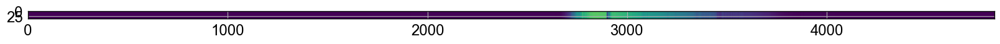

In [34]:
plt.figure(figsize=(20,20))
plt.imshow(simspectra_data[:,:],vmin=0,vmax=1e-12)
plt.xmin=(0.,10000.)

### Make tables

In [35]:
allspectra_sim=simspectra_data[1:,:]
thewl_sim=simspectra_data[0,:]

In [36]:
NBSPECSIM=allspectra_sim.shape[0]

In [37]:
allwl_sim = [thewl_sim for _ in range(NBSPECSIM)]

In [38]:
allwl_sim =np.array(allwl_sim )

In [39]:
allwl_sim=allwl_sim/10.

In [40]:
print NBSPECSIM

35


(0.0, 1000.0)

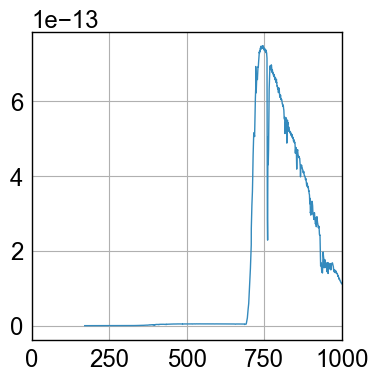

In [41]:
sel=1
plt.plot(allwl_sim[sel],allspectra_sim[sel])
plt.xlim(0.,1000.)

### Input data files

In [42]:
input_filelist=os.listdir(inputdir) 

In [43]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [44]:
print input_filelist[0:5]

['calibSpectra_20170531_074.fits' 'calibSpectra_20170531_075.fits'
 'calibSpectra_20170531_076.fits' 'calibSpectra_20170531_077.fits'
 'calibSpectra_20170531_078.fits']


In [45]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [46]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file 
            
            if re.search('.*fits$',filename):  #example of filename filter
                
                num_str=re.findall(SelectTagRe,file)[0]
               
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)   
                
                
    return indexes_files, filelist_fitsimages

In [47]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # filter to select fits file only

In [48]:
# transform into numpy arrays
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [49]:
print indexes_files

[ 74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91
  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108]


In [50]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [51]:
sorted_numbers=indexes_files[sorted_indexes]

In [52]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34]


In [53]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [54]:
sorted_files[0:5]

array(['./spectrum_calibspec/calibSpectra_20170531_074.fits',
       './spectrum_calibspec/calibSpectra_20170531_075.fits',
       './spectrum_calibspec/calibSpectra_20170531_076.fits',
       './spectrum_calibspec/calibSpectra_20170531_077.fits',
       './spectrum_calibspec/calibSpectra_20170531_078.fits'], 
      dtype='|S51')

## Build full filename
----------------------------

In [55]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [56]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [57]:
print sorted_filenames.shape

(35,)


## Acces to spectrum data
----------------------------------

In [58]:
%%cython

import numpy as np
from astropy.io import fits

def BuildCalibSpec(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawSpec
    ===============
    """

    all_dates = []
    all_airmass = []
    all_leftspectra_data = []
    all_rightspectra_data = []
    
    all_leftspectra_wl = []
    all_rightspectra_wl = []
    all_titles = []
    all_header = []
    all_expo = []
    all_filt= []
    all_hum = []
    
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        
        #hdu_list.info()
        
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        filters = header['FILTERS'].split(' ')[1]
        hum= float(header['OUTHUM'])
        
        
        # now reads the spectra
        
        table_data=hdu_list[1].data
        
        #cols = hdu_list[1].columns
        #cols.info()
        #print hdu_list[1].columns
        #cols.names
  
        #col1=fits.Column(name='CalibLeftSpecWL',format='E',array=theleftwl_cut[idx[0]])
        #col2=fits.Column(name='CalibLeftSpecData',format='E',array=theleftspectrum_cut[idx[0]])
        #col3=fits.Column(name='CalibLeftSpecSim',format='E',array=theleftsimspec_cut[idx[0]])
        #col4=fits.Column(name='CalibRightSpecWL',format='E',array=therightwl_cut[idx[0]])
        #col5=fits.Column(name='CalibRightSpecData',format='E',array=therightspectrum_cut[idx[0]])
        #col6=fits.Column(name='CalibRightSpecSim',format='E',array=therightsimspec_cut[idx[0]])
    
    
        left_spectrum_wl=table_data.field('CalibLeftSpecWL')
        left_spectrum_data=table_data.field('CalibLeftSpec')
       
        
        right_spectrum_wl=table_data.field('CalibRightSpecWL')
        right_spectrum_data=table_data.field('CalibRightSpec')
       
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        
        all_leftspectra_data.append(left_spectrum_data)
        all_rightspectra_data.append(right_spectrum_data)
        
        all_leftspectra_wl.append(left_spectrum_wl)
        all_rightspectra_wl.append(right_spectrum_wl)
        
       
        
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        
        all_filt.append(filters)
        all_hum.append(hum)
            
        hdu_list.close()
        
    return all_dates,all_airmass,all_titles,all_header,all_expo, all_leftspectra_data,all_rightspectra_data, all_leftspectra_wl,all_rightspectra_wl,all_filt,all_hum

In [59]:
all_dates,all_airmass,all_titles,all_header,all_expo,all_leftspectra_data,all_rightspectra_data,all_leftspectra_wl,all_rightspectra_wl,all_filt,all_hum=BuildCalibSpec(sorted_files,sorted_numbers,object_name)

In [229]:
all_header[0]

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
OBJECT  = 'HD111980'           / Name of object observed                        
OBSERVER= '        '           / observer                                       
PROPID  = '        '           / Proposal ID                                    
RECID   = 'ct36.20170601.030908' / NOAO Archibe record ID                       
PROPID  = '        '           / Proposal ID                                    
IMAGETYP= 'object  '           / Type of picture (object, dark, comp, etc)      
CCDSUM  = '1 1     '        

In [60]:
NDATA=len(all_dates)

In [61]:
print NDATA

35


In [62]:
all_dt=all_dates

In [63]:
Thor300_index=np.where(np.array(all_filt) == 'Thor300')[0]
Ron400_index=np.where(np.array(all_filt) == 'Ron400')[0]
HoloPhP_index=np.where(np.array(all_filt) == 'HoloPhP')[0]
HoloPhAg_index=np.where(np.array(all_filt) == 'HoloPhAg')[0]
HoloAmAg_index=np.where(np.array(all_filt) == 'HoloAmAg')[0]

In [64]:
print Thor300_index
print Ron400_index
print HoloPhP_index
print HoloPhAg_index
print HoloAmAg_index

[ 1  6 11 16 21 26 31]
[ 0  5 10 15 20 25 30]
[ 2  7 12 17 22 27 32]
[ 3  8 13 18 23 28 33]
[ 4  9 14 19 24 29 34]


## Airmasses

In [65]:
NDATA=len(all_rightspectra_data)
all_dt= [ parser.parse(all_dates[i]) for i in range(NDATA)]

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs [u'lw', u'linewidth'] which are all aliases for u'linewidth'.  Kept value from u'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


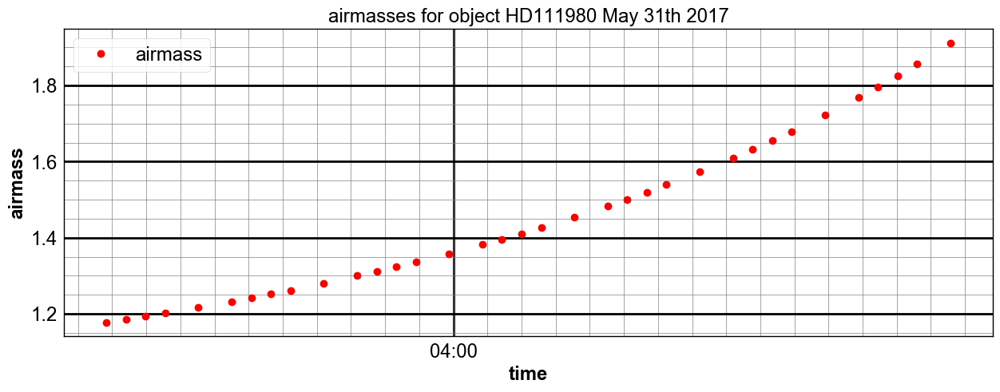

In [66]:
fig=plt.figure(figsize=(15,5))

ax=fig.add_subplot(1,1,1)
ax.plot_date(all_dt, all_airmass,marker='o',color='red',lw=0,label='airmass',linewidth=3)
#ax.plot_date(all_dt, am,marker='.',color='blue',lw=0,label='relative airmass',linewidth=3)

#ax.set_ylim(0.,2)

date_range = all_dt[NDATA-1] - all_dt[0]

if date_range > datetime.timedelta(days = 1):
    ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax.get_xaxis().set_minor_locator(mdates.HourLocator(byhour=range(0,24,2)))
    #ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
else:
    ax.xaxis.set_major_locator(mdates.HourLocator(byhour=range(0,24,2)))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    #ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_xaxis().set_minor_locator(mdates.MinuteLocator(byminute=range(0,60,5)))
    
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='grey', linewidth=0.5)
ax.set_ylabel('airmass')
ax.set_xlabel('time')


title='airmasses for object {}'.format(object_name)

plt.title(title)
plt.legend(loc='best')

figfilename=os.path.join(dir_top_images,'airmass_vs_time.pdf')
fig.savefig(figfilename)

## Dispersers

In [67]:
ListOfDisperserNames=['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']

## Show Spectra
-----------------------

In [68]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math as m
import os

from matplotlib.backends.backend_pdf import PdfPages
    
def ShowSpectraOld(all_spectra,all_wl,all_titles,object_name,all_filt,dir_top_img):
    """
    ShowSpectra: Show the raw images without background subtraction
    ==============
    """
    NBSPEC=len(all_spectra)
    NBIMGPERROW=2
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    #MAXIMGROW=int(MAXIMGROW)
        
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'intput_calibrated_spectra.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Calibrated spectra for {}'.format(object_name)
         
    thex0 = []  # container of central position   
        
    
    for index in np.arange(0,NBSPEC):
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20,fontweight='bold')
            
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        spectrum=all_spectra[index]
       
        wl=all_wl[index]
        axarr[iy,ix].plot(wl,spectrum,'r-',lw=2,label='data')
        
        
        max_y_to_plot=spectrum[:].max()*1.2
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
       
        axarr[iy,ix].set_title(all_titles[index])
        #axarr[iy,ix].set_title(all_filt[index])
        axarr[iy,ix].set_xlabel("wavelength (nm)")
        
        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='grey', linewidth=0.5)
      
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    

In [69]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math as m
import os

from matplotlib.backends.backend_pdf import PdfPages
 
NormSpecRange= [790,810] # range where to normalize


def ShowSpectra(all_spectra,all_wl,all_titles,object_name,all_filt,dir_top_img,sim_data):
    """
    ShowSpectra: Show the raw images without background subtraction
    ==============
    """
    NBSPEC=len(all_spectra)
    NBIMGPERROW=2
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    #MAXIMGROW=int(MAXIMGROW)
        

    calibdatasimfactor = []    
        
        
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'intput_calibrated_spectra.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Calibrated spectra for {}'.format(object_name)
         
    thex0 = []  # container of central position   
    wl_sim=sim_data[0]/10.
    
    for index in np.arange(0,NBSPEC):
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20,fontweight='bold')
 


  


        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        wl=all_wl[index]  # wavelength in data
        
        spectrum=all_spectra[index]   # data
        
        maxdata_in_range=np.max(spectrum[np.where(np.logical_and(wl>NormSpecRange[0],wl<NormSpecRange[1]))]) # max in data in selected wl range
        
        
        spectrum_sim=sim_data[index+1] # sim
        maxsim_in_range=np.max(spectrum_sim[np.where(np.logical_and(wl_sim>NormSpecRange[0],wl_sim<NormSpecRange[1]))]) # max in sim in selected wl range
        
        calibfactor=maxdata_in_range/maxsim_in_range   # calib factor data/sim in wl range
        
        calibdatasimfactor.append(calibfactor) # for later analysis
        
       
        axarr[iy,ix].plot(wl,spectrum,'r-',lw=2,label='data') # plot data
        
        
        spectrum_sim=spectrum_sim*calibfactor  # renormalize the sim to data units
        
        axarr[iy,ix].plot(wl_sim,spectrum_sim,'b-',lw=2,label='sim')
        
        max_y_to_plot=spectrum[:].max()*1.4
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].set_xlim(0.,1200.)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.4, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
       
        axarr[iy,ix].set_title(all_titles[index])
        #axarr[iy,ix].set_title(all_filt[index])
        axarr[iy,ix].set_xlabel("wavelength (nm)")
        
        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='grey', linewidth=0.5)
      
        axarr[iy,ix].legend()
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
            
                
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    return np.array(calibdatasimfactor)
    

### Work only on right spectra

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


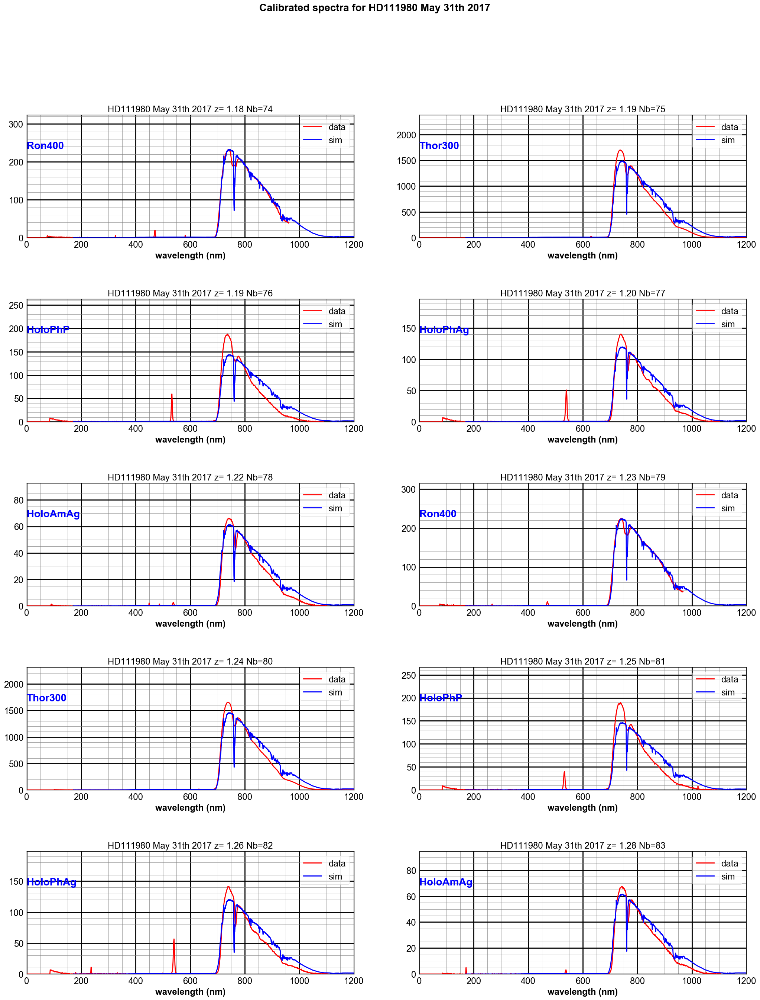

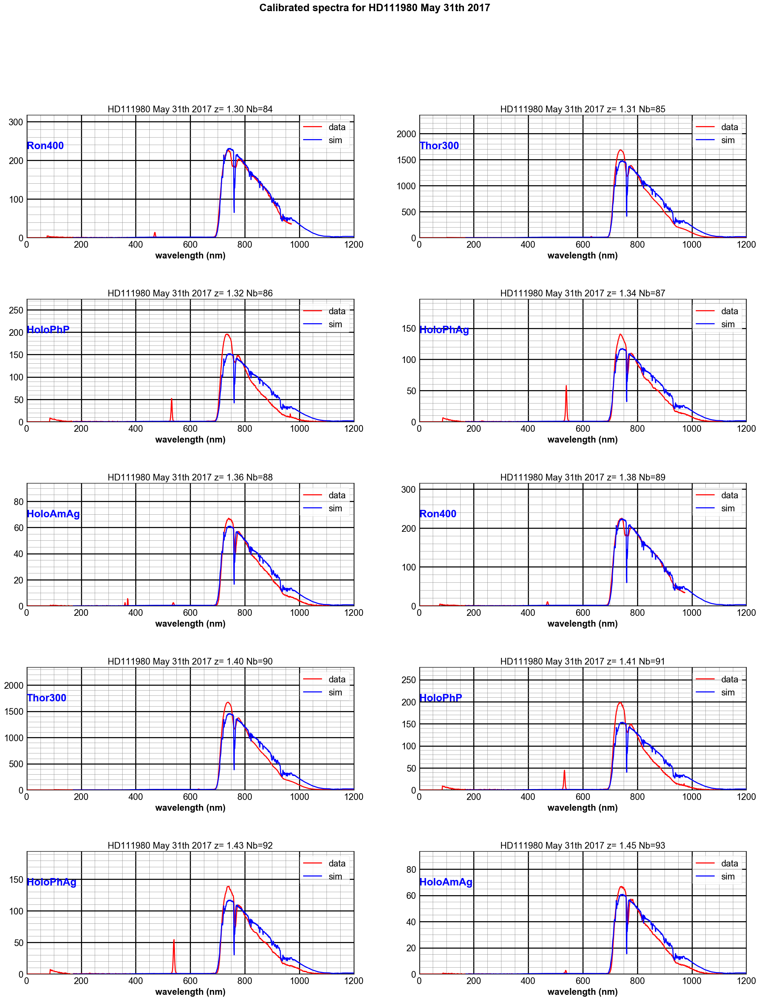

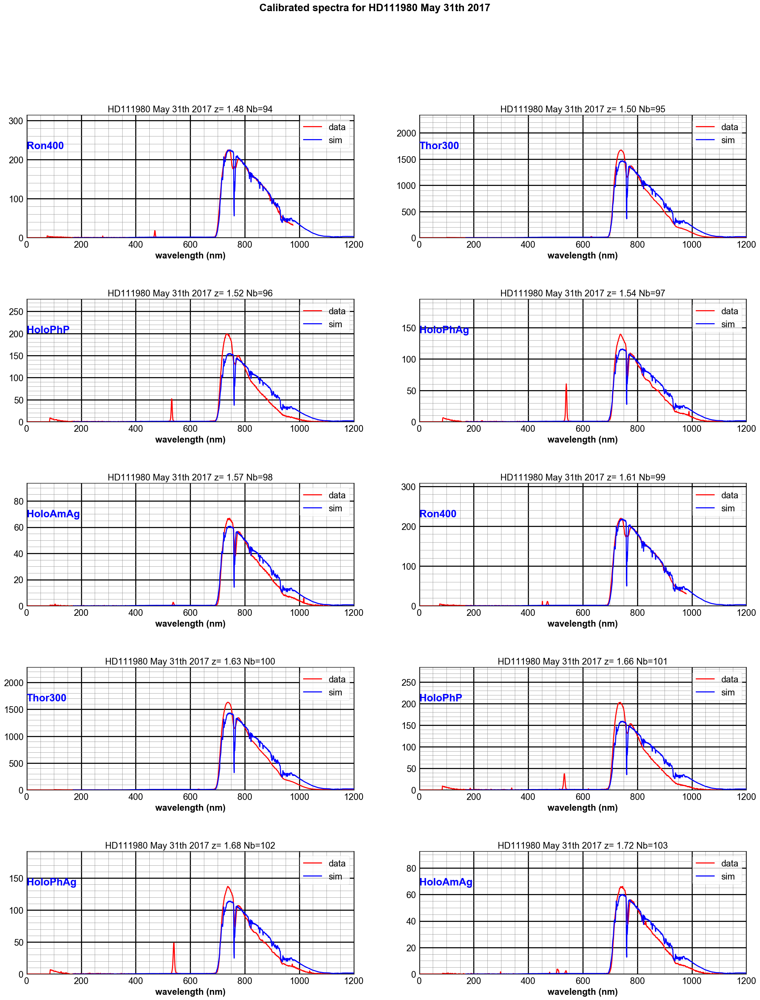

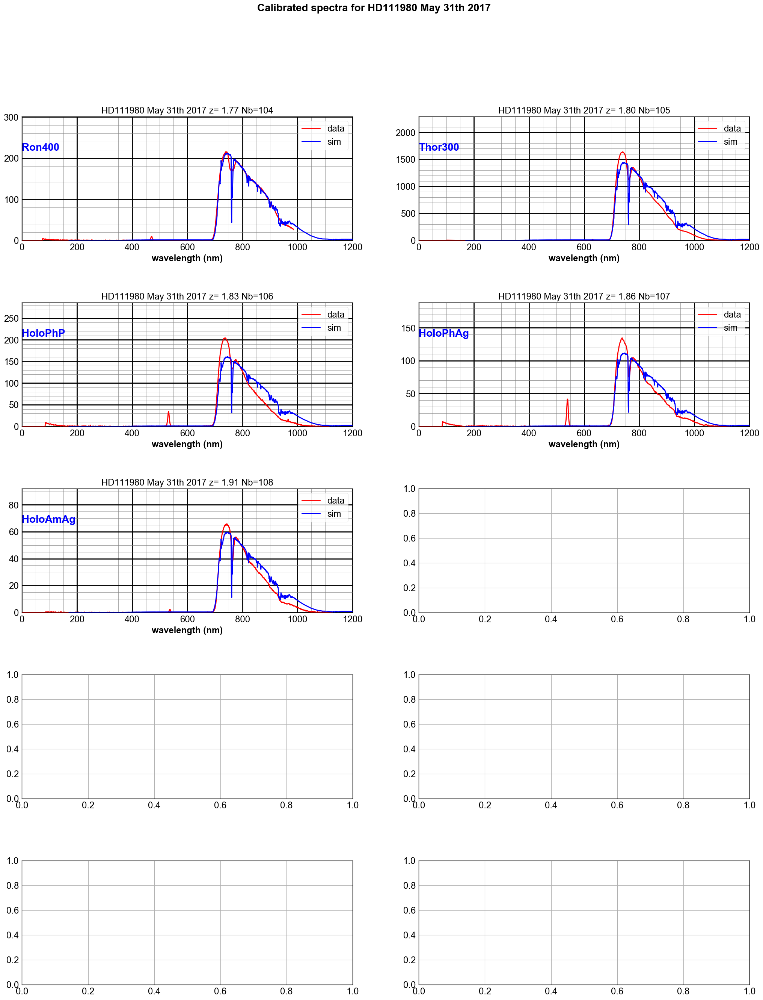

In [70]:
#                       ShowSpectra(all_rightspectra_data,all_rightspectra_wl,all_titles,object_name,all_filt,dir_top_images)
all_calibdatasimfactors=ShowSpectra(all_rightspectra_data,all_rightspectra_wl,all_titles,object_name,all_filt,dir_top_images,simspectra_data)

# Start the analysis

## Few definition

In [71]:
wl_O2Aline=759.37      # Balmer Lines
wl_O2Bline=686.719
wl_Haline=656.281 
wl_Hbline=486.134
wl_Hgline=434.047 
wl_Hdline=410.175
wl_Heline=397.0

In [72]:
def ShowOneSpectrum(sel):
    """
    ShowOneSpectrum
    ================
    """

    # get sim spectrum
    wl_sim=simspectra_data[0]/10.
    spectrum_sim=simspectra_data[sel+1]*all_calibdatasimfactors[sel] # sim
    
    
    # get the data
    thespectrum=all_rightspectra_data[sel]
    thewl=all_rightspectra_wl[sel]
    
    
    
    ymin=thespectrum.min()
    ymax=thespectrum.max()*1.1

    fig, ax = plt.subplots(1, 1, figsize=(15,8))


    ax.plot(thewl,thespectrum,'r-',lw=2,label='data')
    ax.plot(wl_sim,spectrum_sim,'b-',lw=2,label='sim')

    max_y_to_plot=thespectrum[:].max()*1.2
    ax.set_ylim(0.,max_y_to_plot)
    ax.text(0.,max_y_to_plot*1.1/1.2, all_filt[sel],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)

    ax.set_title(all_titles[sel])
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b-',label='$O_2(A)$',lw=1)
    ax.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b-',label='$O_2(B)$',lw=1)
    ax.plot([wl_Haline,wl_Haline],[ymin,ymax],'r-',label='$H_{alpha}$',lw=1)
    ax.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g-',label='$H_{beta}$',lw=1)
    ax.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c-',label='$H_{gamma}$',lw=1)
    ax.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k-',label='$H_{delta}$',lw=1)
    ax.plot([wl_Heline,wl_Heline],[ymin,ymax],'y-',label='$H_{delta}$',lw=1)

    ax.legend(loc=3,fontsize=20)
    ax.set_xlim(0,1100)
    ax.set_xlabel("$\lambda$ (nm)")
    
    figfilename=os.path.join(dir_top_images,'one_intput_calibrated_spectra.pdf')
    fig.savefig(figfilename)

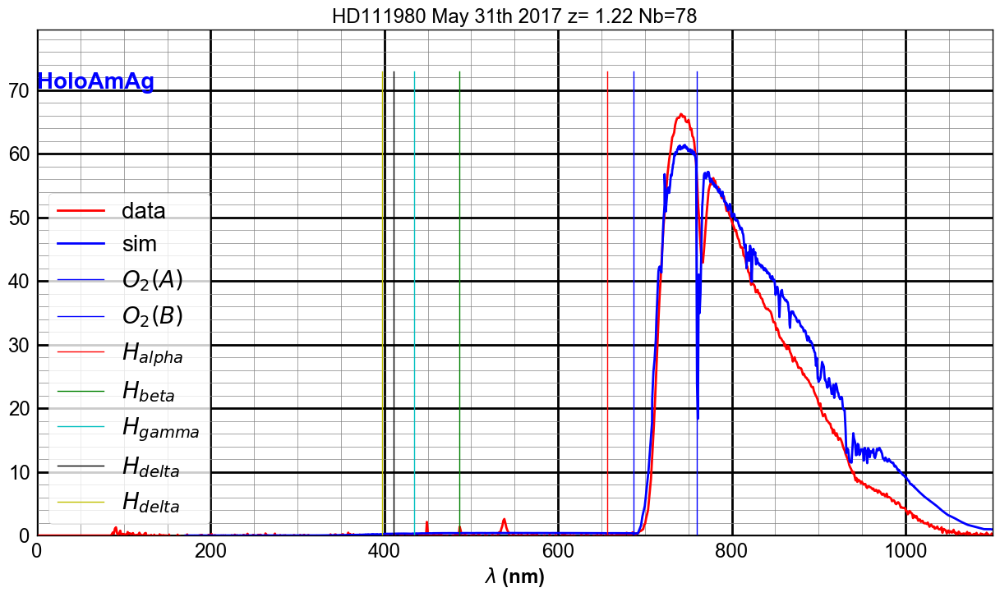

In [73]:
ShowOneSpectrum(4)

In [74]:
def ShowOneSpectrumNextFilt(sel):
    """
    ShowOneSpectrum
    ================
    """

    NBSPECTOPLOT=5
    
    the_spectra= []
    the_wl=[]
    the_max = []
    the_label= []
    
    for i in np.arange(NBSPECTOPLOT):

        the_spectrum=all_rightspectra_data[sel+i]
        thewl=all_rightspectra_wl[sel+i]
        theymin=the_spectrum.min()
        theymax=the_spectrum.max()
        thelabel=all_filt[sel+i]
        
        the_spectra.append(the_spectrum)
        the_wl.append(thewl)
        the_max.append(theymax)
        the_label.append(thelabel)

        
    fig, ax = plt.subplots(1, 1, figsize=(15,8))
    for i in np.arange(NBSPECTOPLOT):        
        ax.plot(the_wl[i],the_spectra[i],lw=3,label=the_label[i])

 
        
    max_y_to_plot=(np.array(the_max)).max()
    ymin=0
    ymax=max_y_to_plot
    ax.set_ylim(0.,max_y_to_plot)
    
    ax.set_title(all_titles[sel])
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b:',label='$O_2(A)$',lw=3)
    ax.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b:',label='$O_2(B)$',lw=3)
    ax.plot([wl_Haline,wl_Haline],[ymin,ymax],'r:',label='$H_{alpha}$',lw=3)
    ax.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g:',label='$H_{beta}$',lw=3)
    ax.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c:',label='$H_{gamma}$',lw=3)
    ax.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k:',label='$H_{delta}$',lw=3)
    ax.plot([wl_Heline,wl_Heline],[ymin,ymax],'y:',label='$H_{delta}$',lw=3)

    ax.legend(loc='best',fontsize=20)
    ax.set_xlim(0,1100)
    ax.set_xlabel("$\lambda$ (nm)")
    
    figfilename=os.path.join(dir_top_images,'five_intput_calibrated_spectra.pdf')
    fig.savefig(figfilename)

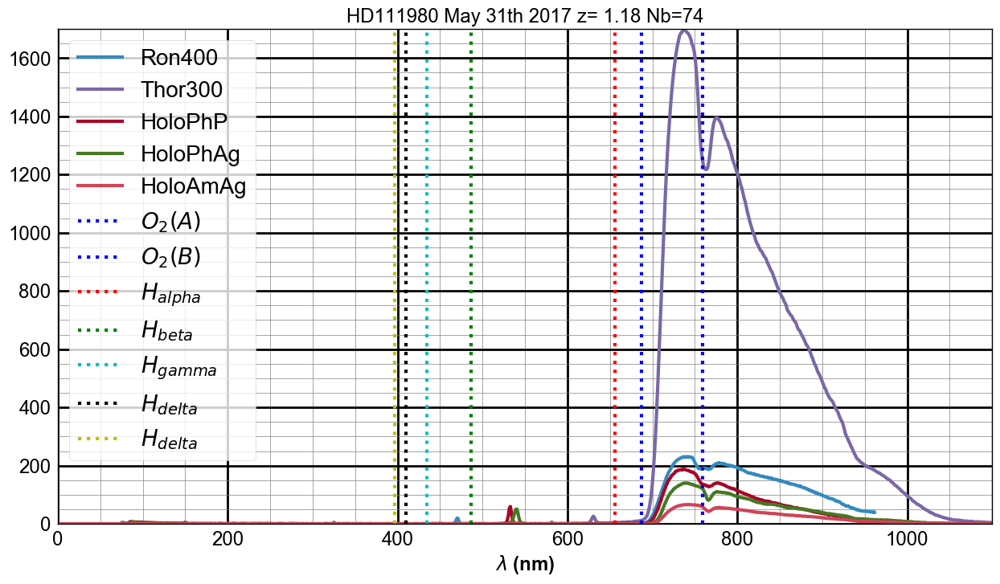

In [75]:
 ShowOneSpectrumNextFilt(0)

# Measurement of Equivalent Width
==============================================

## Select the spectrum under study

In [76]:
sel=0 # spectrum number

In [77]:
thespectrum=all_rightspectra_data[sel]
thewl=all_rightspectra_wl[sel]
thelabel=all_filt[sel]

In [78]:
wl_sim=simspectra_data[sel]/10.
spectrum_sim=simspectra_data[sel+1]*all_calibdatasimfactors[sel] # sim

## O2 absorption line

In [79]:
#O2WL1=732
#O2WL2=744
O2WL1=740
O2WL2=750
O2WL3=780
O2WL4=790

In [80]:
def ShowEquivalentWidth(wl,spec,wl1,wl2,wl3,wl4):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    plt.figure()
    plt.plot(wl_cut,spec_cut)
    plt.plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    plt.plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    plt.plot(x_cont,y_cont,'o')
    
    plt.plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    plt.grid(True)
    plt.title('Equivalent width computation')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    plt.figure()
    plt.plot(wl_cut,ratio)
    plt.plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    plt.plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    plt.grid(True)
    
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    return equivalent_width

In [217]:
def ShowEquivalentWidthNonLinear(wl,spec,wl1,wl2,wl3,wl4):
    """
    ShowEquivalentWidthNonLinear : show how the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    plt.figure()
    plt.plot(wl_cut,spec_cut)
    plt.plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    plt.plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,2)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    plt.plot(x_cont,y_cont,'o')
    
    plt.plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    plt.grid(True)
    plt.title('Equivalent width computation')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    plt.figure()
    plt.plot(wl_cut,ratio)
    plt.plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    plt.plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    plt.grid(True)
    
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    return equivalent_width

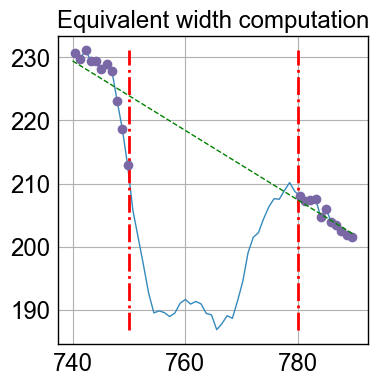

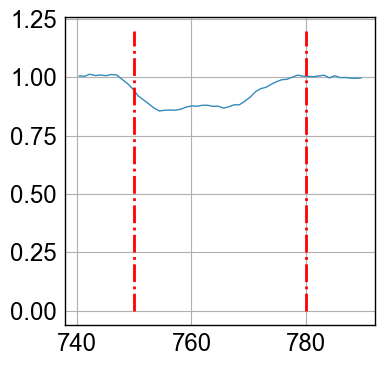

In [81]:
EQW_DATA = ShowEquivalentWidth(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

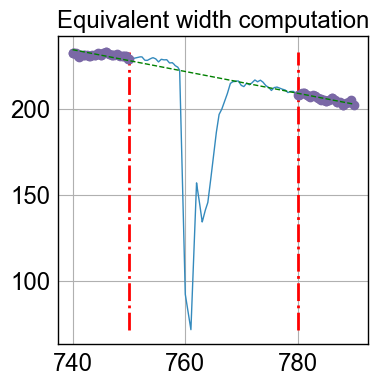

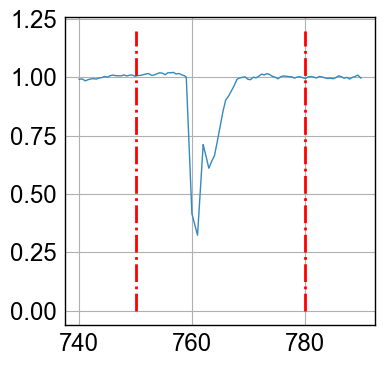

In [82]:
EQW_SIM = ShowEquivalentWidth(wl_sim,spectrum_sim,O2WL1,O2WL2,O2WL3,O2WL4)

In [83]:
def ComputeEquivalentWidth(wl,spec,wl1,wl2,wl3,wl4):
    """
    ComputeEquivalentWidth : compute the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
     
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    

    # compute bin size in the band
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                                  
    
    # calculation of equivalent width    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()    
    
    return equivalent_width

In [84]:
def ShowEquivalentWidth2(wl,spec,wl1,wl2,wl3,wl4,label='absortion line'):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    
    f, axarr = plt.subplots(1,2,figsize=(9,3))
    
    
    ## Figure 1
    ##------------
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    axarr[0].plot(wl_cut,spec_cut)
    axarr[0].plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    axarr[0].plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    axarr[0].plot(x_cont,y_cont,'o')
    axarr[0].plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    axarr[0].grid(True)
    axarr[0].set_xlabel('$\lambda$ (nm)')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    # Figure 2
    #-----------
    axarr[1].plot(wl_cut,ratio)
    axarr[1].plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    axarr[1].plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    axarr[1].grid(True)
    
    axarr[1].set_xlabel('$\lambda$ (nm)')
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    title = 'Equivalent width computation for {}'.format(label)
    f.suptitle(title)
    
    return equivalent_width

In [220]:
def ShowEquivalentWidth2NonLinear(wl,spec,wl1,wl2,wl3,wl4,label='absortion line'):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    
    f, axarr = plt.subplots(1,2,figsize=(9,3))
    
    
    ## Figure 1
    ##------------
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    axarr[0].plot(wl_cut,spec_cut)
    axarr[0].plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    axarr[0].plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,3)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    axarr[0].plot(x_cont,y_cont,'o')
    axarr[0].plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    axarr[0].grid(True)
    axarr[0].set_xlabel('$\lambda$ (nm)')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    # Figure 2
    #-----------
    axarr[1].plot(wl_cut,ratio)
    axarr[1].plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    axarr[1].plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    axarr[1].grid(True)
    
    axarr[1].set_xlabel('$\lambda$ (nm)')
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    title = 'Equivalent width computation for {}'.format(label)
    f.suptitle(title)
    
    return equivalent_width

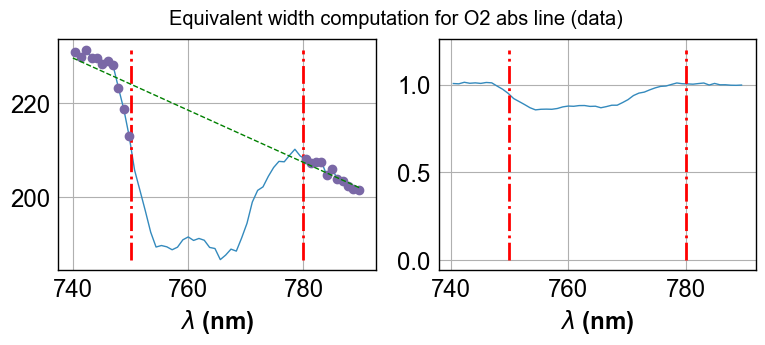

In [85]:
EQW_DATA = ShowEquivalentWidth2(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4,'O2 abs line (data)')

In [86]:
print EQW_DATA

2.66779


In [87]:
print ComputeEquivalentWidth(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

2.66779


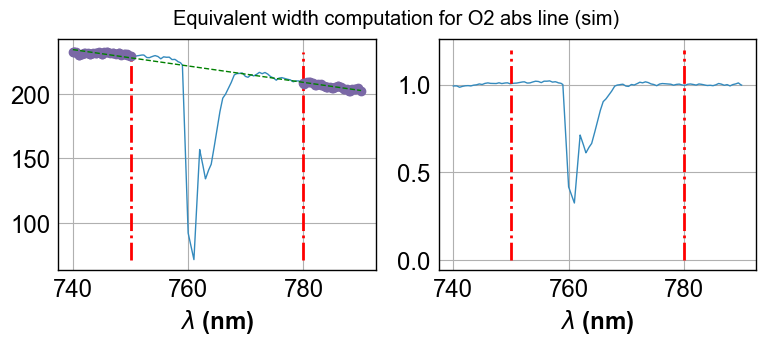

In [88]:
EQW_SIM = ShowEquivalentWidth2(wl_sim,spectrum_sim,O2WL1,O2WL2,O2WL3,O2WL4,'O2 abs line (sim)')

In [89]:
print EQW_SIM

2.49886738103


## A) O2 absorption line
-------------------------------

In [90]:
EQW_DATA_O2 = ComputeEquivalentWidth(thewl,thespectrum,732,744,770,790)

In [91]:
print ' EQW_DATA(O2) = ',EQW_DATA_O2, 'nm'

 EQW_DATA(O2) =  2.18758 nm


In [92]:
WL1_O2_DATA=O2WL1
WL2_O2_DATA=O2WL2
WL3_O2_DATA=O2WL3
WL4_O2_DATA=O2WL4

In [93]:
WL1_O2_SIM=O2WL1
WL2_O2_SIM=O2WL2
WL3_O2_SIM=O2WL3
WL4_O2_SIM=O2WL4

In [94]:
def ShowAllEquivalentWidth(all_wl,all_spec,wl1,wl2,wl3,wl4,label='absorption line'):
        
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        
        newlabel = label+ ' for img {} with disp {}'.format(index,all_filt[index]) 
        
        ShowEquivalentWidth2(wl,spectrum,wl1,wl2,wl3,wl4,label=newlabel)


In [222]:
def ShowAllEquivalentWidthNonLinear(all_wl,all_spec,wl1,wl2,wl3,wl4,label='absorption line'):
        
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        
        newlabel = label+ ' for img {} with disp {}'.format(index,all_filt[index]) 
        
        ShowEquivalentWidth2NonLinear(wl,spectrum,wl1,wl2,wl3,wl4,label=newlabel)


In [95]:
def ComputeAllEquivalentWidth(all_wl,all_spec,wl1,wl2,wl3,wl4):
    
    EQW_coll = []
    
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        eqw=ComputeEquivalentWidth(wl,spectrum,wl1,wl2,wl3,wl4)
        EQW_coll.append(eqw)
        
    return EQW_coll

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


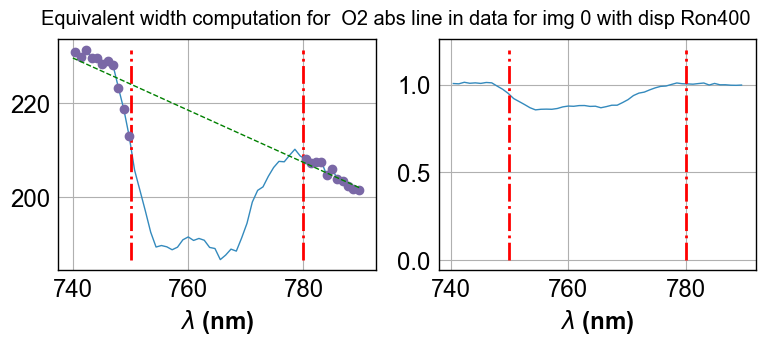

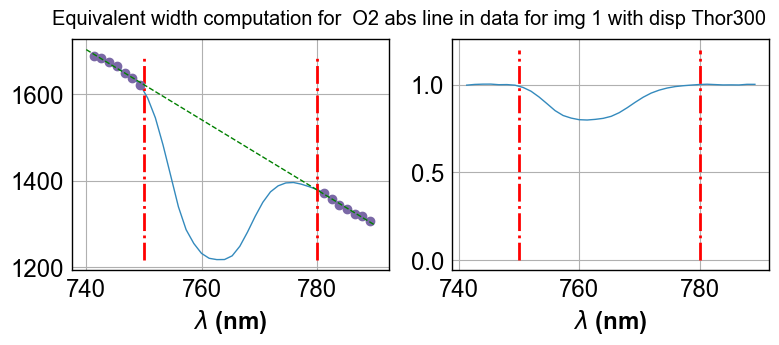

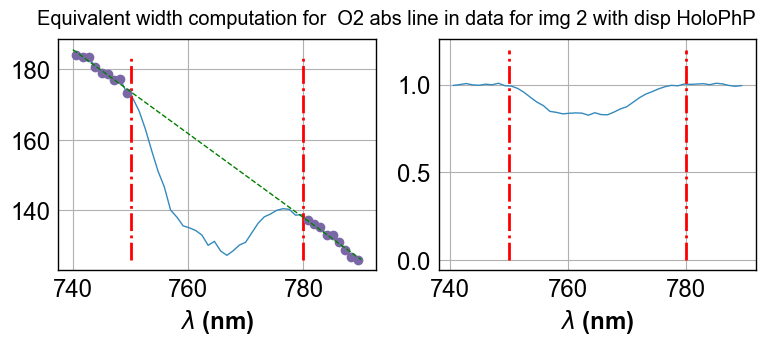

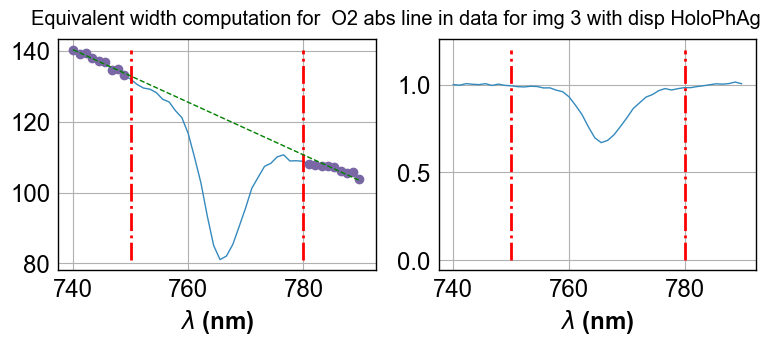

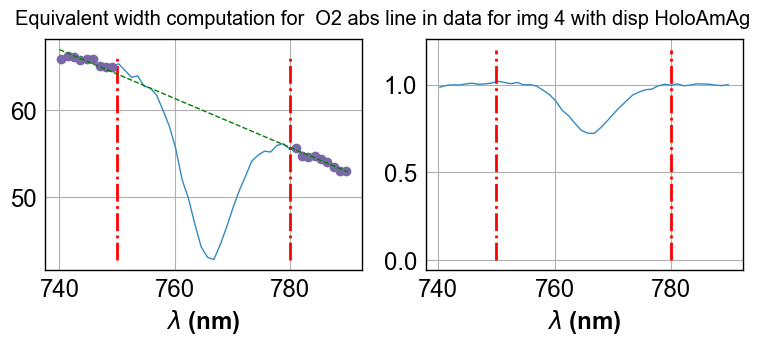

...

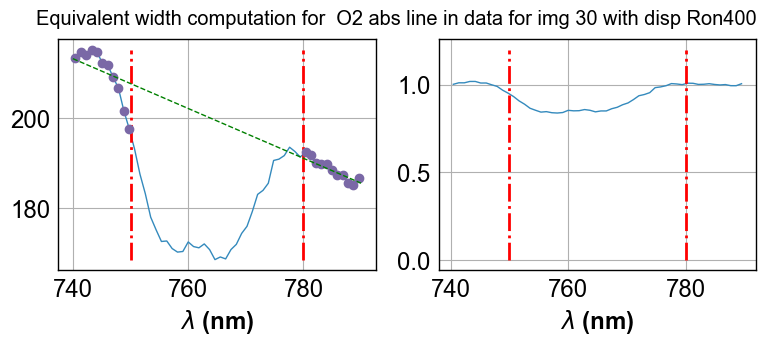

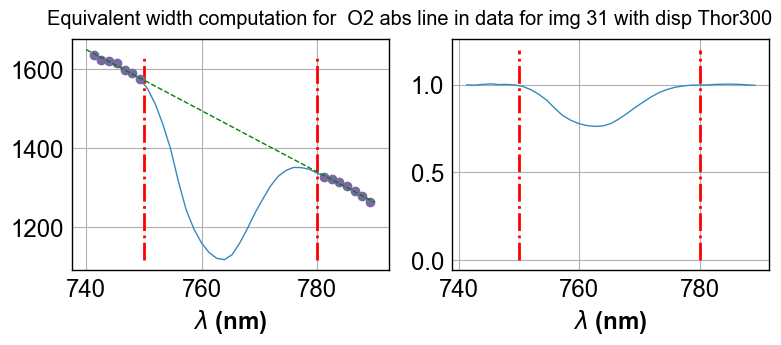

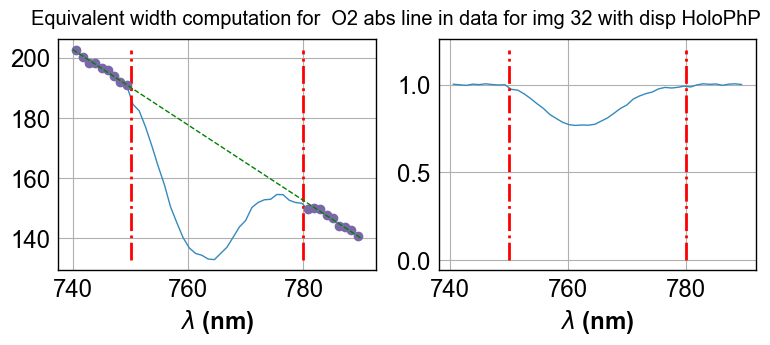

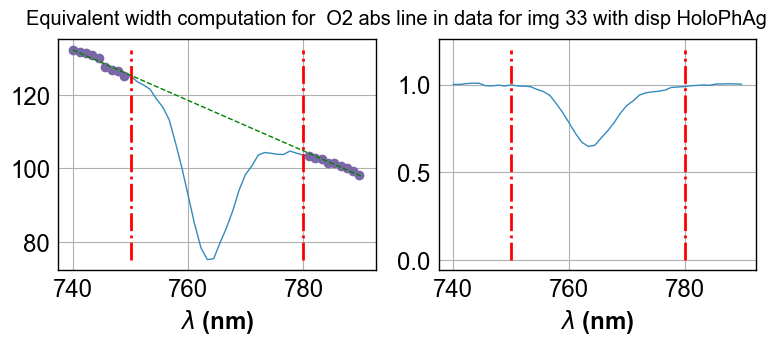

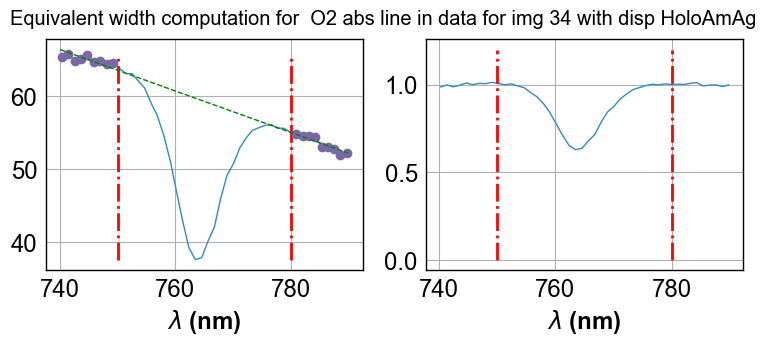

In [96]:
ShowAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA,' O2 abs line in data')

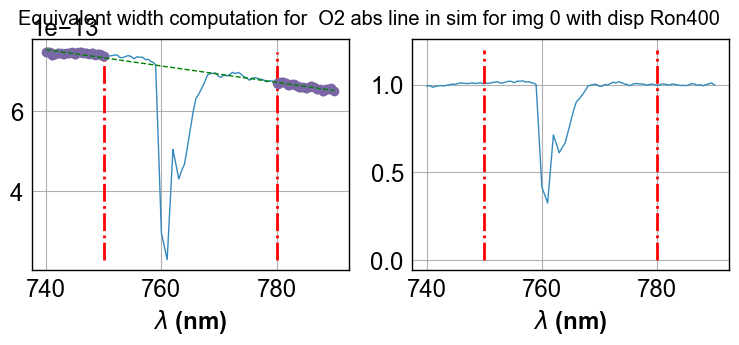

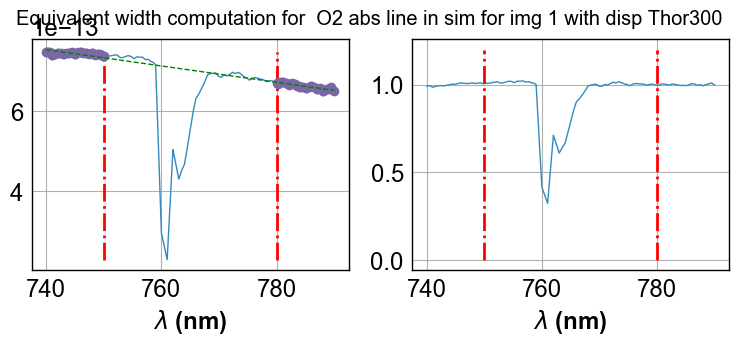

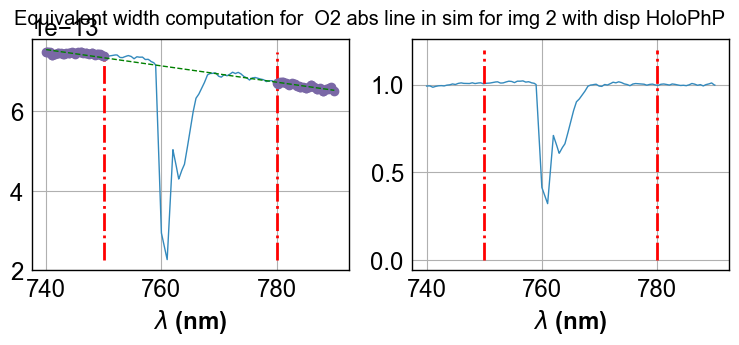

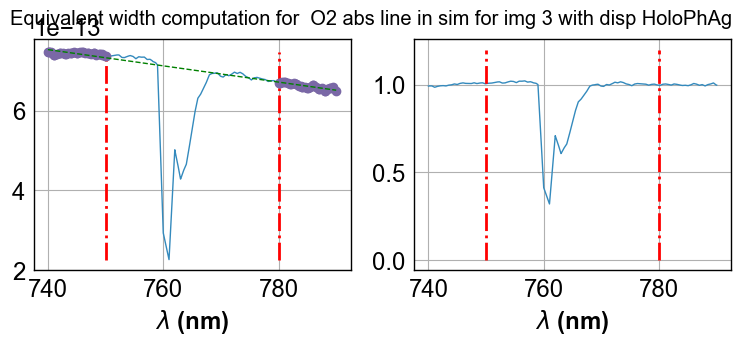

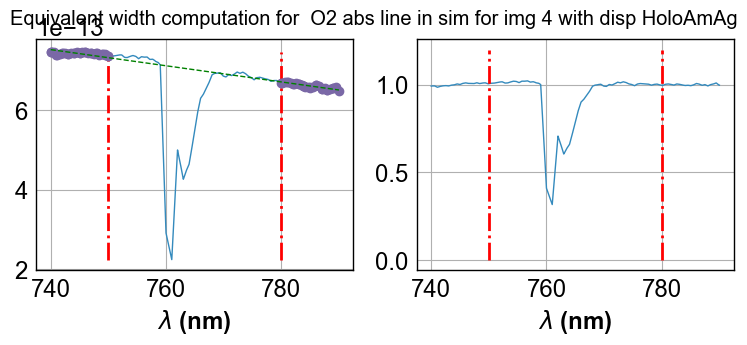

...

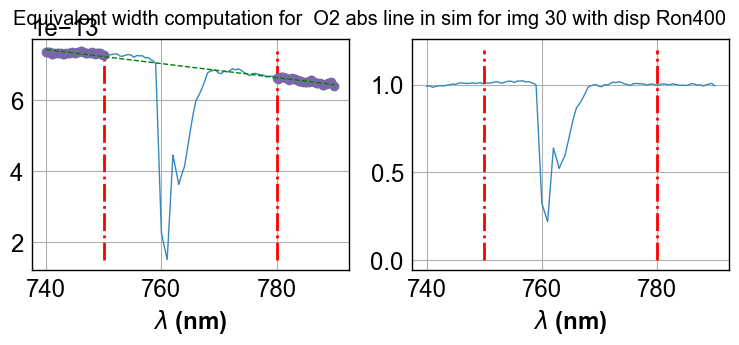

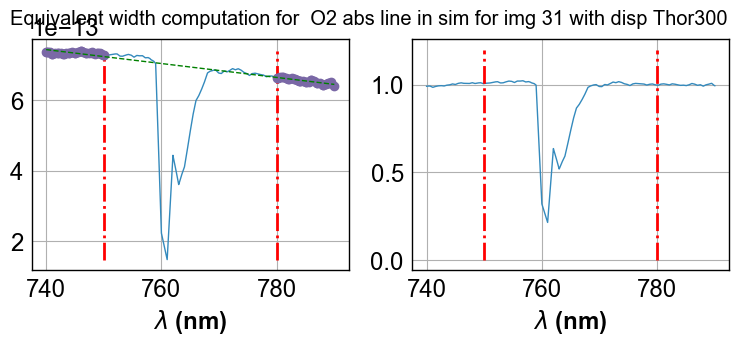

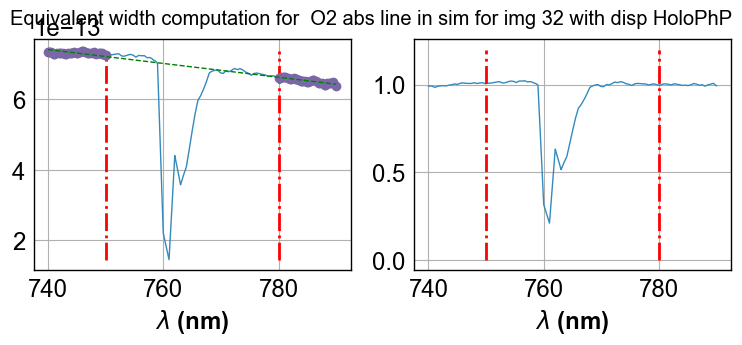

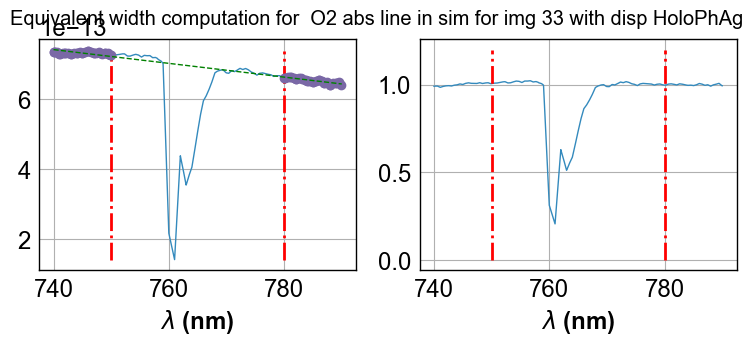

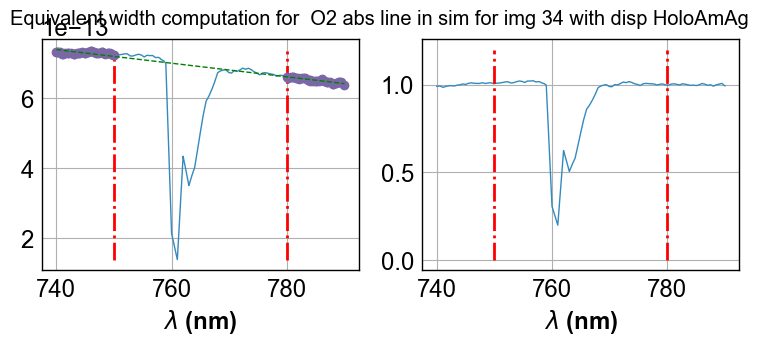

In [97]:
ShowAllEquivalentWidth(allwl_sim,allspectra_sim,WL1_O2_SIM,WL2_O2_SIM,WL3_O2_SIM,WL4_O2_SIM,' O2 abs line in sim')

In [98]:
All_eqw_O2_Data=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA)

In [99]:
All_eqw_O2_Sim=ComputeAllEquivalentWidth(allwl_sim,allspectra_sim,WL1_O2_SIM,WL2_O2_SIM,WL3_O2_SIM,WL4_O2_SIM)

In [100]:
All_eqw_O2_Data=np.array(All_eqw_O2_Data)
All_eqw_O2_Sim=np.array(All_eqw_O2_Sim)

In [101]:
am=np.array(all_airmass)

In [102]:
ListOfDisperserNames=['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']

In [103]:
def PlotEquivalentWidthVsAirMass(all_eqw_width,all_eqw_width_sim,all_am,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    
    am1 = []
    eqw1 = []
    
    am2 = []
    eqw2 = []
    
    am3 = []
    eqw3 = []
    
    am4 = []
    eqw4 = []
    
    amsim= []
    eqwsim= []
    
    max_y_to_plot=max(all_eqw_width)*1.2
    min_y_to_plot=0.
    
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        amsim.append(am)
        eqwsim.append(all_eqw_width_sim[idx])
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
        else:
            print 'disperser ',grating_name,' not found'
            
    fig=plt.figure(figsize=(20,8))

    ax=fig.add_subplot(1,1,1)

    ax.plot(am0,eqw0,marker='o',color='red',lw=1,label=ListOfDisperserNames[0])
    ax.plot(am1,eqw1,marker='o',color='blue',lw=1,label=ListOfDisperserNames[1])
    ax.plot(am2,eqw2,marker='o',color='green',lw=1,label=ListOfDisperserNames[2])
    ax.plot(am3,eqw3,marker='o',color='cyan',lw=1,label=ListOfDisperserNames[3])
    ax.plot(am4,eqw4,marker='o',color='magenta',lw=1,label=ListOfDisperserNames[4])
    
    ax.plot(amsim,eqwsim,marker='o',color='black',lw=1,label='sim')

    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())   
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('AirMass')
    ax.set_ylim(min_y_to_plot,max_y_to_plot)
    


    title='Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc='best')

    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

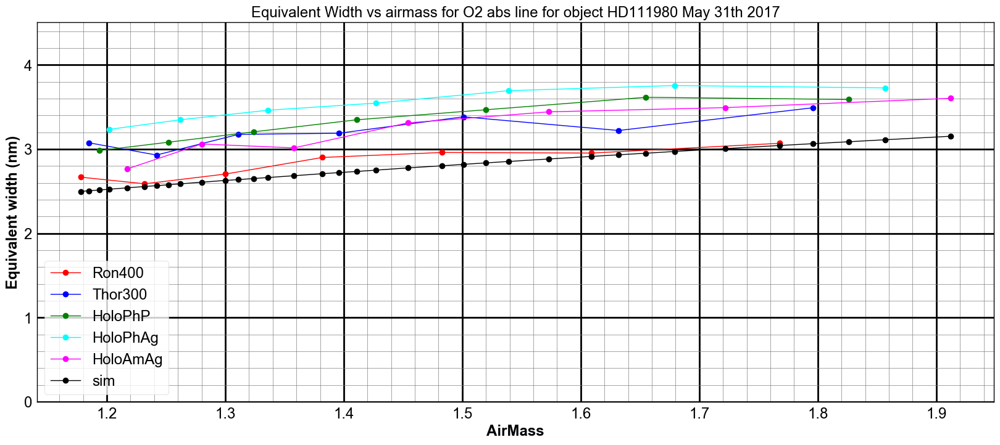

In [104]:
PlotEquivalentWidthVsAirMass(All_eqw_O2_Data,All_eqw_O2_Sim,am,'O2 abs line','eqwvsam_O2.pdf')

In [105]:
def PlotEquivalentWidthVsTime(all_eqw_width,all_eqw_width_sim,all_am,all_dt,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    tim0 = []
    
    am1 = []
    eqw1 = []
    tim1=[]
    
    am2 = []
    eqw2 = []
    tim2=[]
    
    am3 = []
    eqw3 = []
    tim3=[]
    
    am4 = []
    eqw4 = []
    tim4=[]
    
    timsim = []
    eqwsim = []
    
    date_range = all_dt[NDATA-1] - all_dt[0]
    
    max_y_to_plot=max(all_eqw_width)*1.2
    min_y_to_plot=0.
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        timsim.append(all_dt[idx])
        eqwsim.append(all_eqw_width_sim[idx])
        
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
            tim0.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
            tim1.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
            tim2.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
            tim3.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
            tim4.append(all_dt[idx])
        else:
            print 'disperser ',grating_name,' not found'
            
    fig=plt.figure(figsize=(20,8))

    ax=fig.add_subplot(1,1,1)

    ax.plot_date(tim0,eqw0,'-',marker='o',color='red',lw=1,label=ListOfDisperserNames[0])
    ax.plot_date(tim1,eqw1,'-',marker='o',color='blue',lw=1,label=ListOfDisperserNames[1])
    ax.plot_date(tim2,eqw2,'-',marker='o',color='green',lw=1,label=ListOfDisperserNames[2])
    ax.plot_date(tim3,eqw3,'-',marker='o',color='cyan',lw=1,label=ListOfDisperserNames[3])
    ax.plot_date(tim4,eqw4,'-',marker='o',color='magenta',lw=1,label=ListOfDisperserNames[4])
    
    ax.plot(timsim,eqwsim,marker='o',color='black',lw=1,label='sim')
    
    date_range = all_dt[NDATA-1] - all_dt[0]

    if date_range > datetime.timedelta(days = 1):
        ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.get_xaxis().set_minor_locator(mdates.HourLocator(byhour=range(0,24,2)))
        #ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    else:
        ax.xaxis.set_major_locator(mdates.HourLocator(byhour=range(0,24,2)))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        #ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.get_xaxis().set_minor_locator(mdates.MinuteLocator(byminute=range(0,60,5)))
    
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)
    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('time')
#    ax.set_ylim(0.,5.)
    ax.set_ylim(min_y_to_plot,max_y_to_plot)


    title='Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc='best')
    
    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

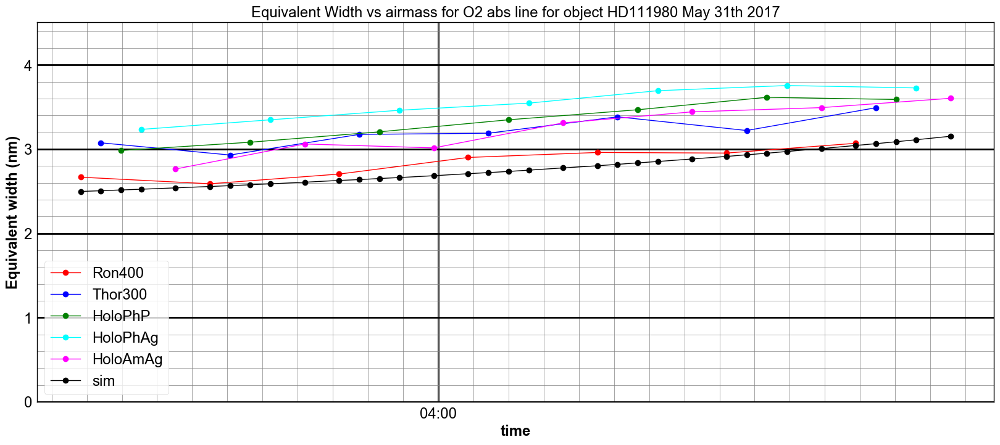

In [106]:
PlotEquivalentWidthVsTime(All_eqw_O2_Data,All_eqw_O2_Sim,am,all_dt,'O2 abs line','eqwvstime_O2.pdf')

## Fit equivalent width

In [107]:
def EqwModel(z,a,b):
    return np.exp(a*np.log(z))+b

In [108]:
def FitEquivalentWidthVsAirMass(all_eqw_width,all_eqw_width_sim,all_am,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    
    am1 = []
    eqw1 = []
    
    am2 = []
    eqw2 = []
    
    am3 = []
    eqw3 = []
    
    am4 = []
    eqw4 = []
    
    amsim= []
    eqwsim= []
    
    max_y_to_plot=max(all_eqw_width)*1.2
    min_y_to_plot=0.
    
    zmin=1.
    zmax=2.
   
    # 1) Fill data
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        amsim.append(am)
        eqwsim.append(all_eqw_width_sim[idx])
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
        else:
            print 'disperser ',grating_name,' not found'
    
    
    # 2) Fit and plot
    fig=plt.figure(figsize=(20,8))
    allz=np.linspace(zmin,zmax,50)
    ax=fig.add_subplot(1,1,1)

    am0=np.array(am0)
    eqw0=np.array(eqw0)
    popt0, pcov0 = curve_fit(EqwModel, am0, eqw0)
    print popt0
    labelfit0='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt0[0],popt0[1])    
    ax.plot(am0,eqw0,marker='o',color='red',lw=0,label=ListOfDisperserNames[0])
    ax.plot(allz, EqwModel(allz, *popt0),'red', label=labelfit0)
    
    
    
    am1=np.array(am1)
    eqw1=np.array(eqw1)
    popt1, pcov1 = curve_fit(EqwModel, am1, eqw1)
    print popt1
    labelfit1='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt1[0],popt1[1])
    ax.plot(am1,eqw1,marker='o',color='blue',lw=0,label=ListOfDisperserNames[1])
    ax.plot(allz, EqwModel(allz, *popt1),'blue', label=labelfit1)
    
    am2=np.array(am2)
    eqw2=np.array(eqw2)
    popt2, pcov2 = curve_fit(EqwModel, am2, eqw2)
    print popt2
    labelfit2='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt2[0],popt2[1])   
    ax.plot(am2,eqw2,marker='o',color='green',lw=0,label=ListOfDisperserNames[2])
    ax.plot(allz, EqwModel(allz, *popt2),'green', label=labelfit2)
    
    
    am3=np.array(am3)
    eqw3=np.array(eqw3)
    popt3, pcov3 = curve_fit(EqwModel, am3, eqw3)
    print popt3
    labelfit3='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt3[0],popt3[1])   
    ax.plot(am3,eqw3,marker='o',color='cyan',lw=0,label=ListOfDisperserNames[3])
    ax.plot(allz, EqwModel(allz, *popt3),'cyan', label=labelfit3)
    
    am4=np.array(am4)
    eqw4=np.array(eqw4)
    popt4, pcov4 = curve_fit(EqwModel, am4, eqw4)
    print popt4
    labelfit4='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(popt4[0],popt4[1])   
    ax.plot(am4,eqw4,marker='o',color='magenta',lw=0,label=ListOfDisperserNames[4])
    ax.plot(allz, EqwModel(allz, *popt4),'magenta', label=labelfit4)
    
    
    amsim=np.array(amsim)
    eqwsim=np.array(eqwsim)
    poptsim, pcovsim = curve_fit(EqwModel, amsim, eqwsim)
    print poptsim
    labelfitsim='fit : eqw=z^{:2.2f}+ {:2.2f}'.format(poptsim[0],poptsim[1]) 
    ax.plot(amsim,eqwsim,marker='o',color='black',lw=0,label='sim')
    ax.plot(allz, EqwModel(allz, *poptsim),'black', label=labelfitsim)
    
    
    
    
    # Final
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())   
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('AirMass')
    ax.set_ylim(min_y_to_plot,max_y_to_plot)
    ax.set_xlim(0.92*zmin,zmax)


    title='Fit Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc=2)

    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

[ 0.83063337  1.49785478]
[ 0.78051603  1.88472419]
[ 1.0082243   1.86890889]
[ 0.82803804  2.16368506]
[ 1.07433725  1.69227935]
[ 0.92798146  1.35082769]


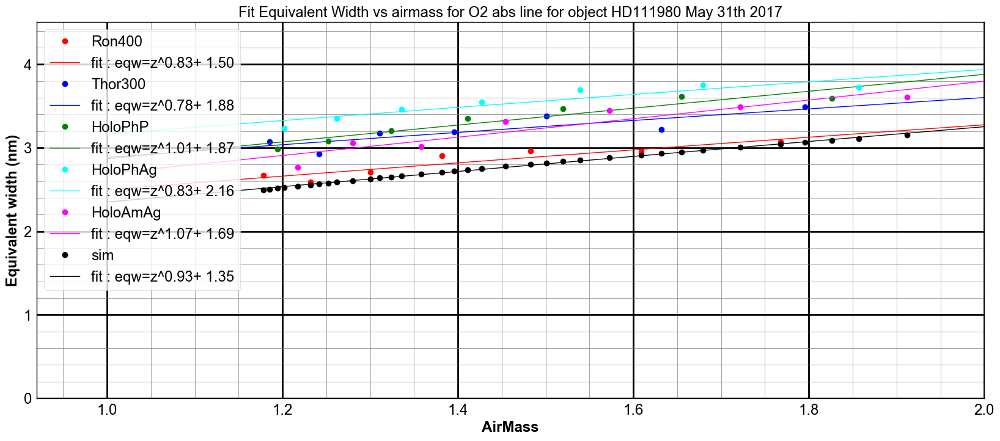

In [109]:
FitEquivalentWidthVsAirMass(All_eqw_O2_Data,All_eqw_O2_Sim,am,'O2 abs line','fiteqwvsam_O2.pdf')

## B) H2O absorption line
-------------------------------

In [226]:
sel=3
thespectrum=all_rightspectra_data[sel]
thewl=all_rightspectra_wl[sel]
thelabel=all_filt[sel]

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned


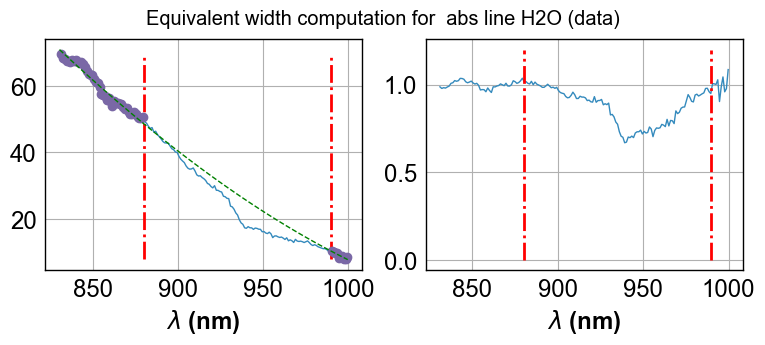

In [227]:
EQW_H2O_DATA = ShowEquivalentWidth2NonLinear(thewl,thespectrum,830,880,990,1000,' abs line H2O (data)')

In [111]:
#EQW_H2O_SIM = ShowEquivalentWidth2(thewl,thesimspectrum,910,920,984,995,' abs line H2O (sim)')

In [112]:
#print EQW_H2O_SIM,' ' ,EQW_H2O_SIM

In [192]:
#EQW_H2O_DATA = ShowEquivalentWidth(thewl,thespectrum,810,850,980,1000)
WL1_H2O_DATA=830
WL2_H2O_DATA=880
WL3_H2O_DATA=990
WL4_H2O_DATA=1000

In [193]:
#EQW_H2O_SIM = ShowEquivalentWidth(thewl,thesimspectrum,910,920,984,995)
WL1_H2O_SIM=WL1_H2O_DATA
WL2_H2O_SIM=WL2_H2O_DATA
WL3_H2O_SIM=WL3_H2O_DATA
WL4_H2O_SIM=WL4_H2O_DATA

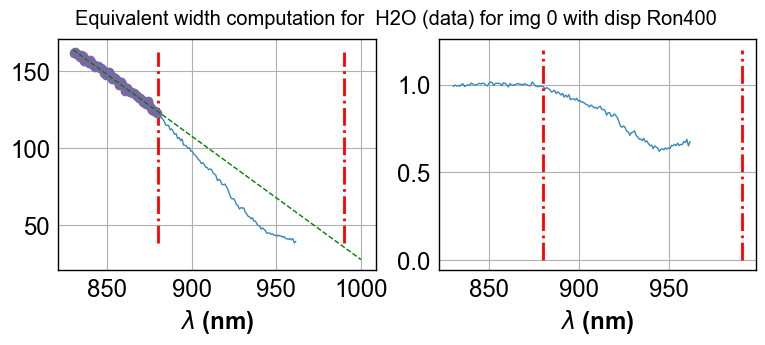

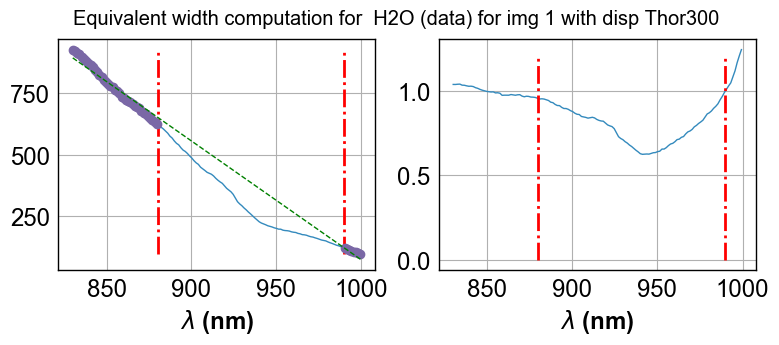

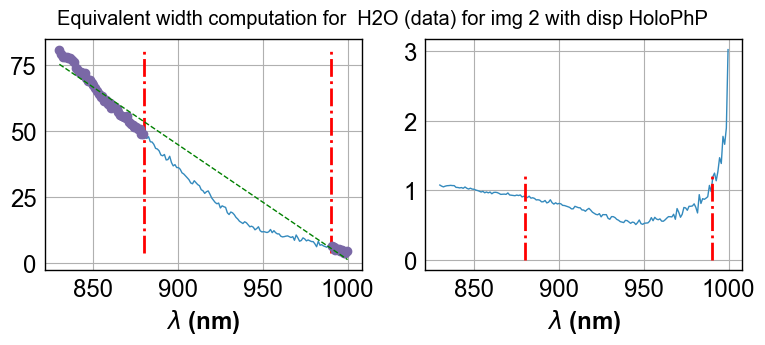

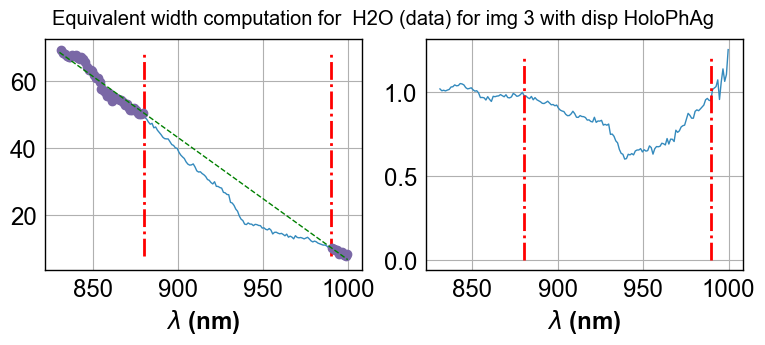

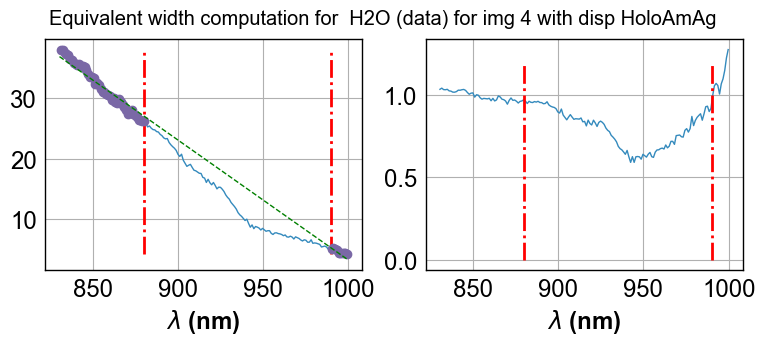

...

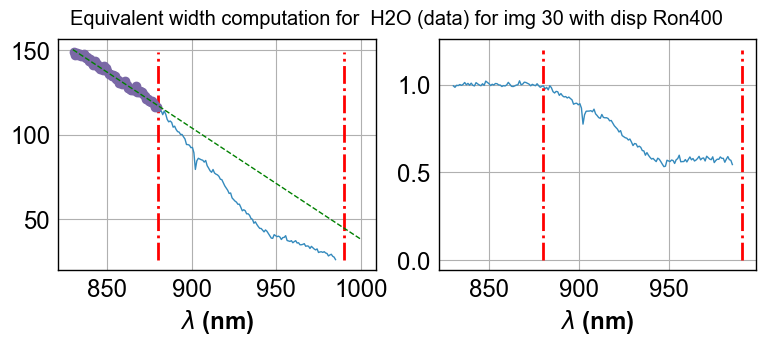

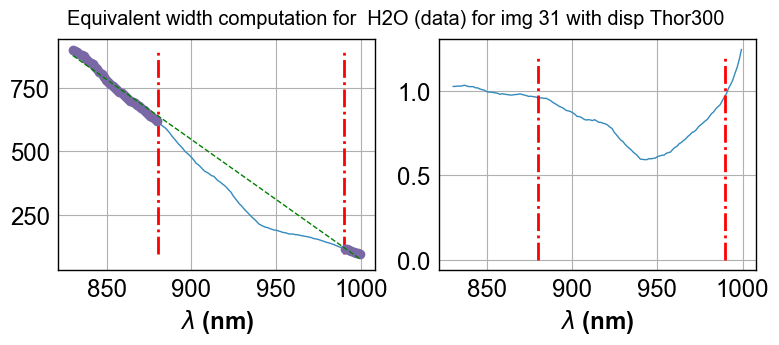

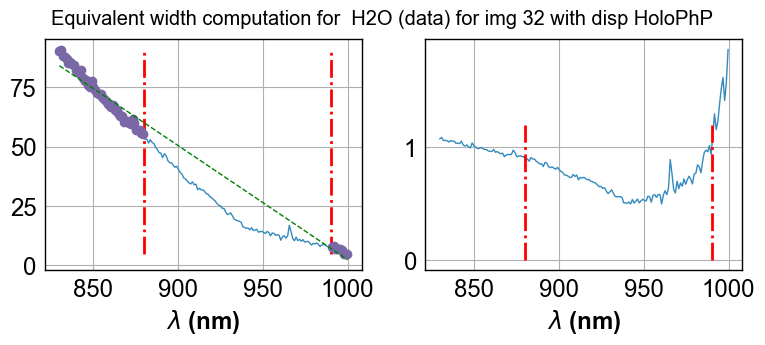

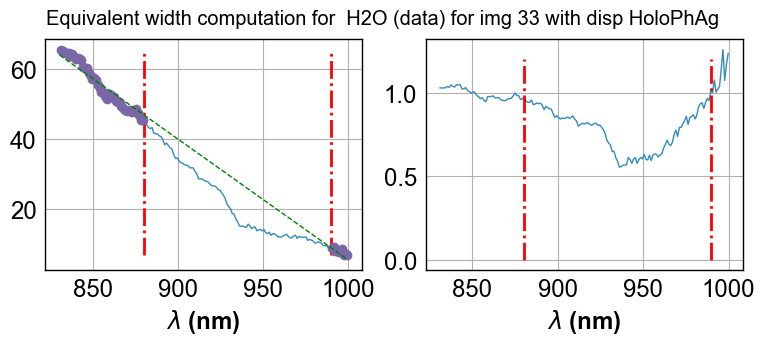

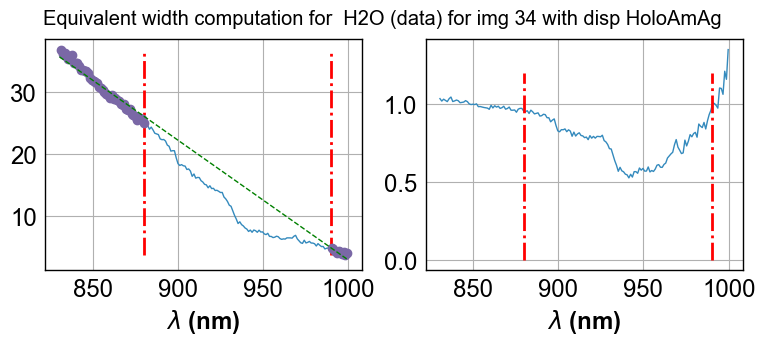

In [194]:
ShowAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' H2O (data)')

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:26: RankWarning: Polyfit may be poorly conditioned
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/li

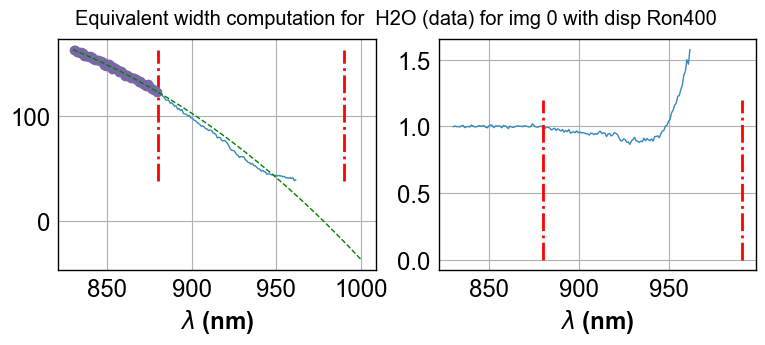

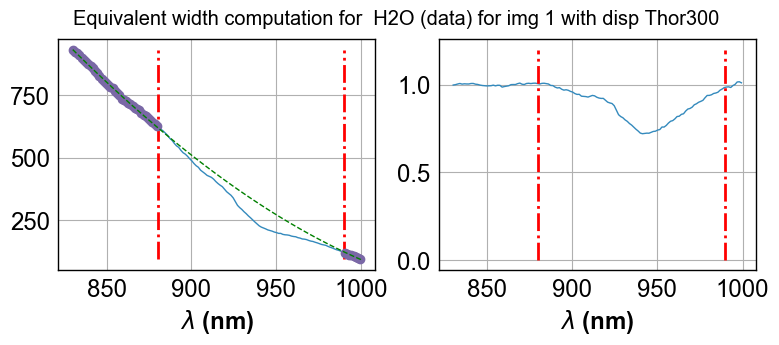

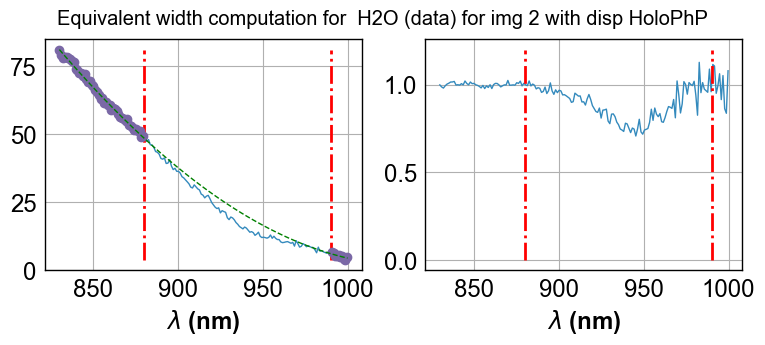

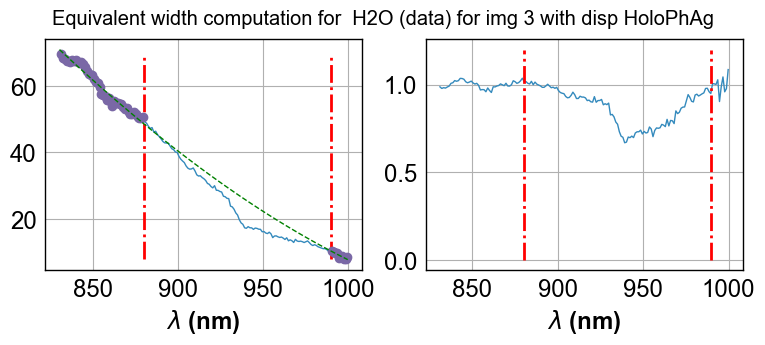

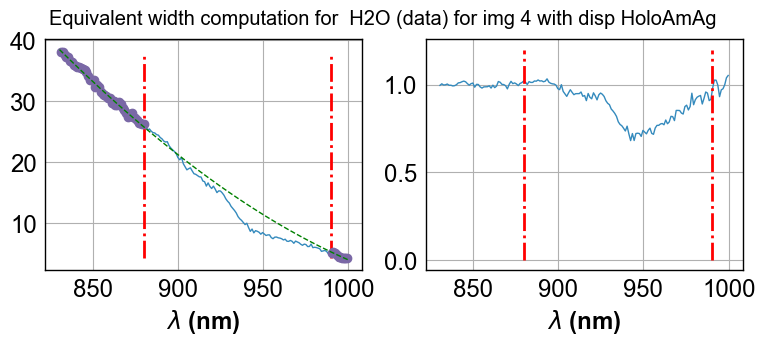

...

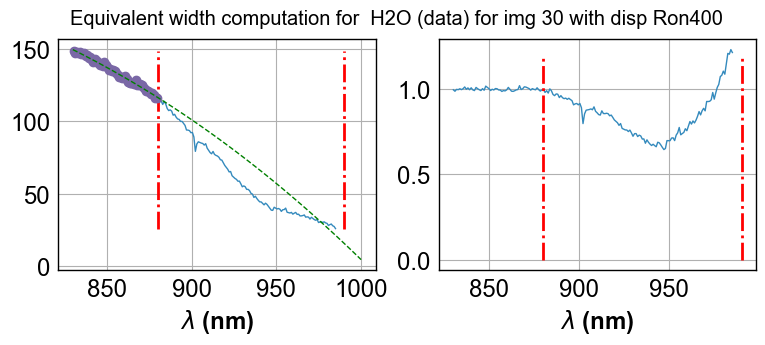

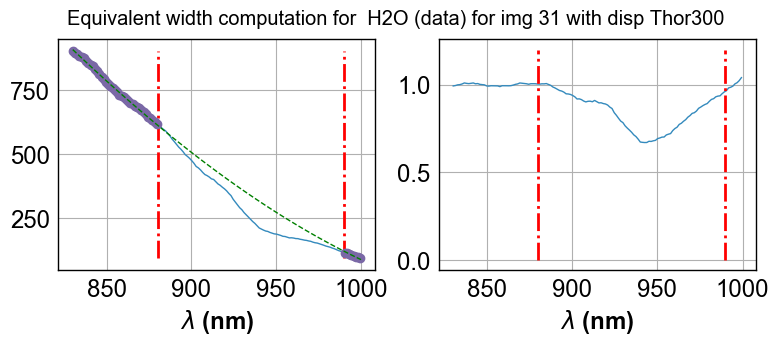

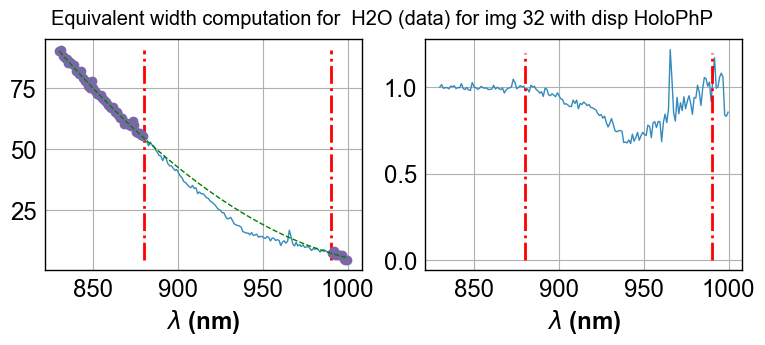

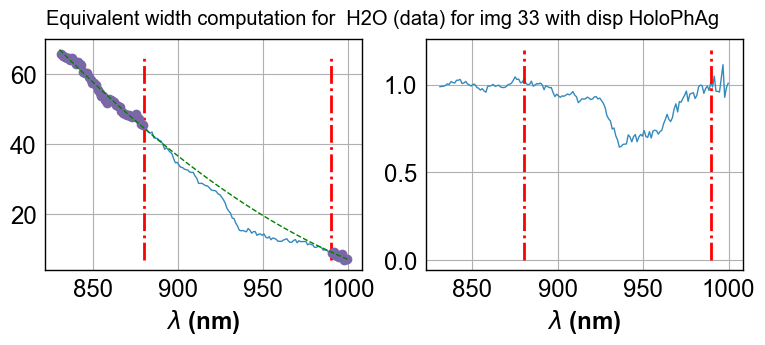

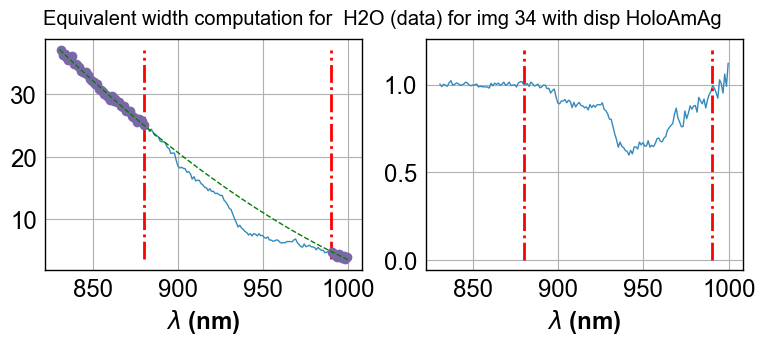

In [223]:
ShowAllEquivalentWidthNonLinear(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' H2O (data)')

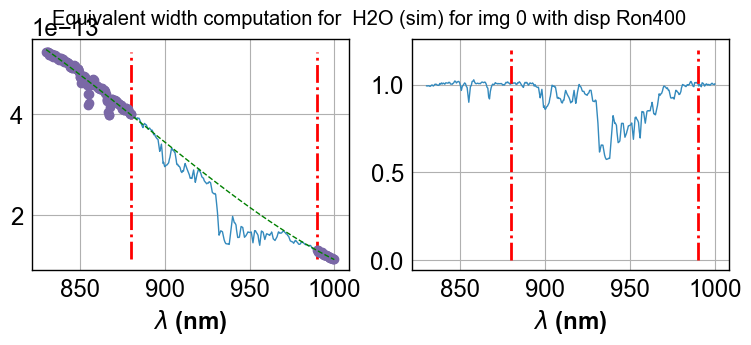

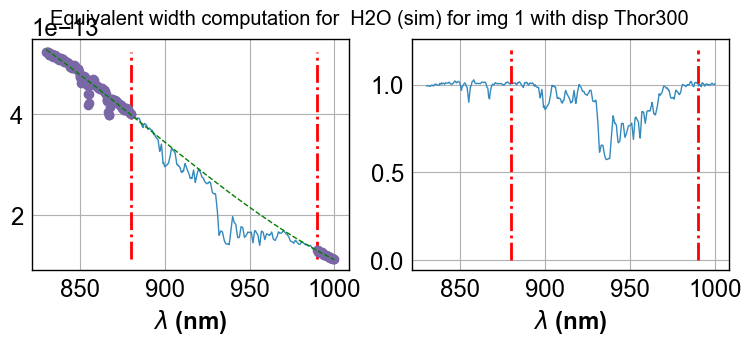

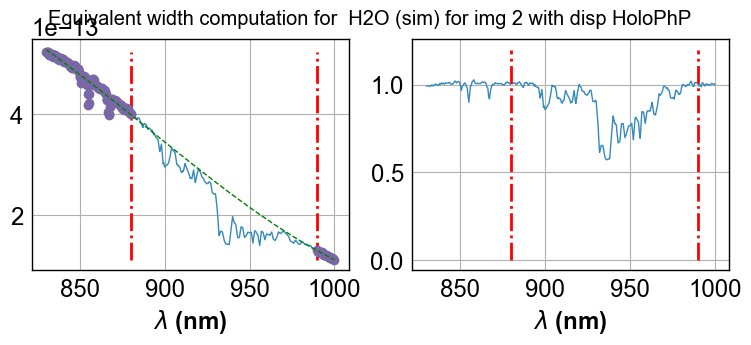

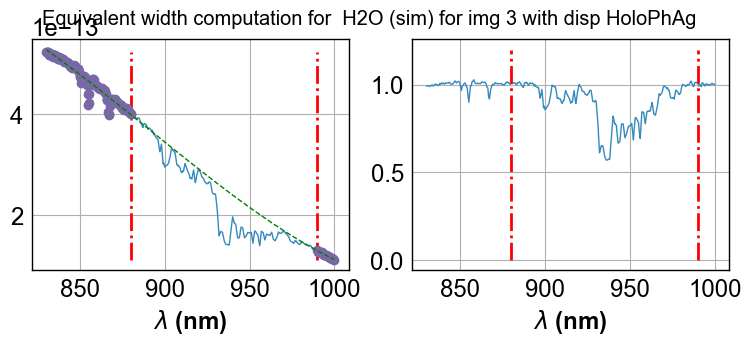

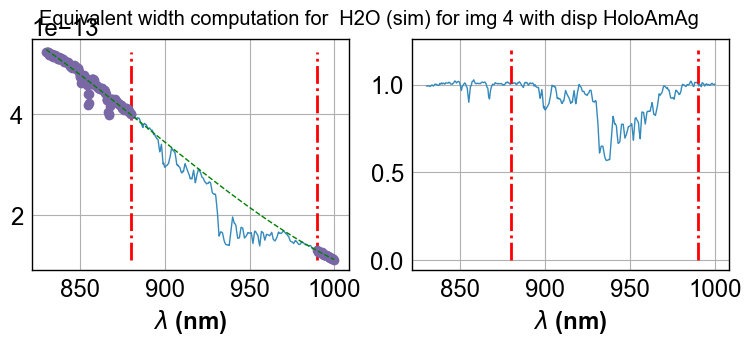

...

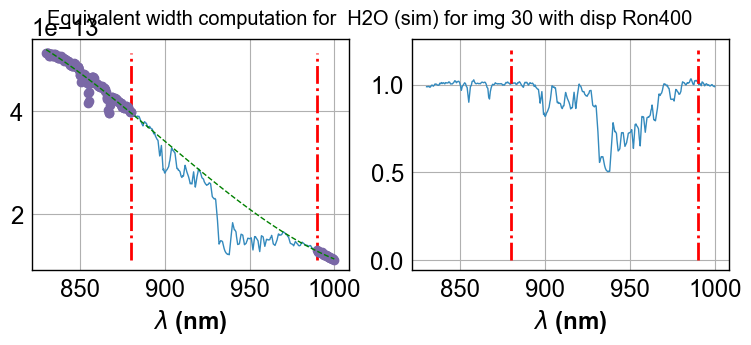

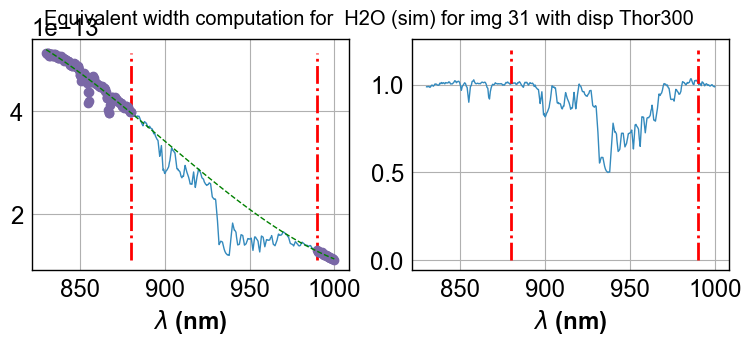

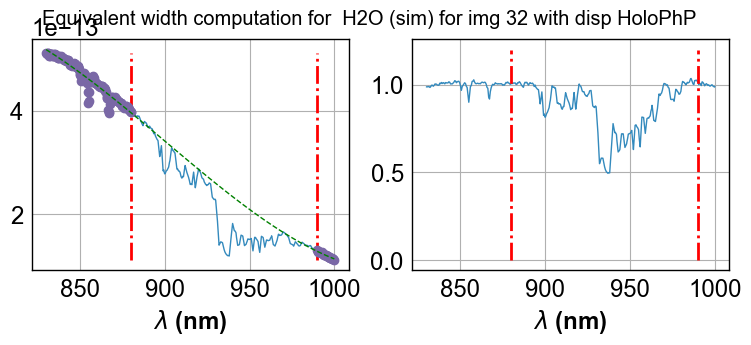

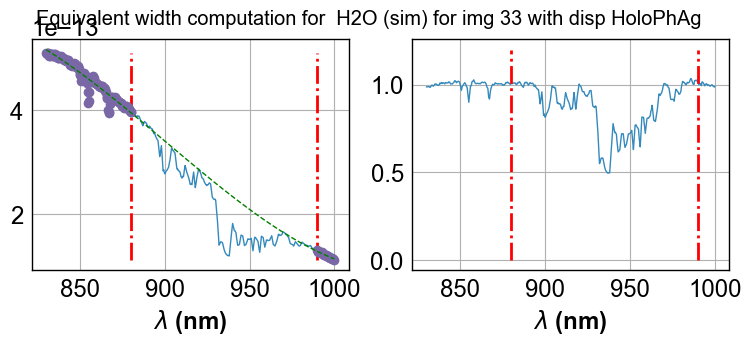

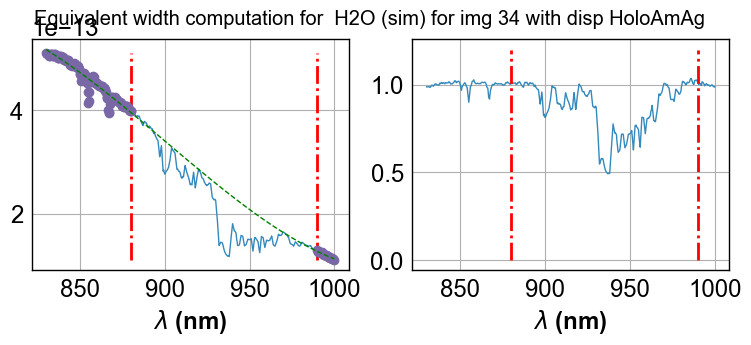

In [228]:
ShowAllEquivalentWidthNonLinear(allwl_sim,allspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM,' H2O (sim)')

In [ ]:
ShowAllEquivalentWidth(allwl_sim,allspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM,' H2O (sim)')

In [196]:
All_eqw_H2O_Data=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA)

In [197]:
All_eqw_H2O_Sim=ComputeAllEquivalentWidth(allwl_sim,allspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM)

In [198]:
All_eqw_H2O_Data=np.array(All_eqw_H2O_Data)
All_eqw_H2O_Sim=np.array(All_eqw_H2O_Sim)

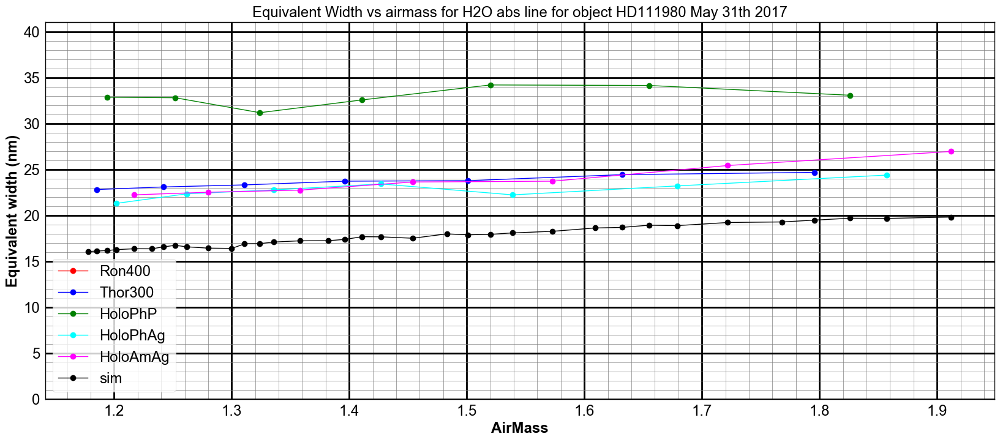

In [199]:
PlotEquivalentWidthVsAirMass(All_eqw_H2O_Data,All_eqw_H2O_Sim,am,'H2O abs line','eqwvsam_H2O.pdf')

[-0.9073373  -3.64980773]
[  2.01460423  21.58848031]
[  1.61061922  31.14894513]
[  2.10834464  20.51146664]
[  2.89572741  20.44355783]
[  2.64374033  14.84144154]


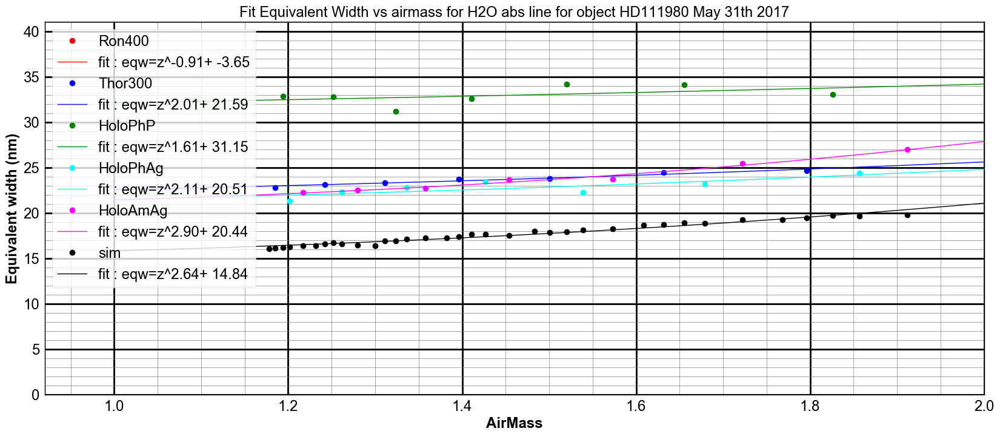

In [200]:
FitEquivalentWidthVsAirMass(All_eqw_H2O_Data,All_eqw_H2O_Sim,am,'H2O abs line','fiteqwvsam_H2O.pdf')

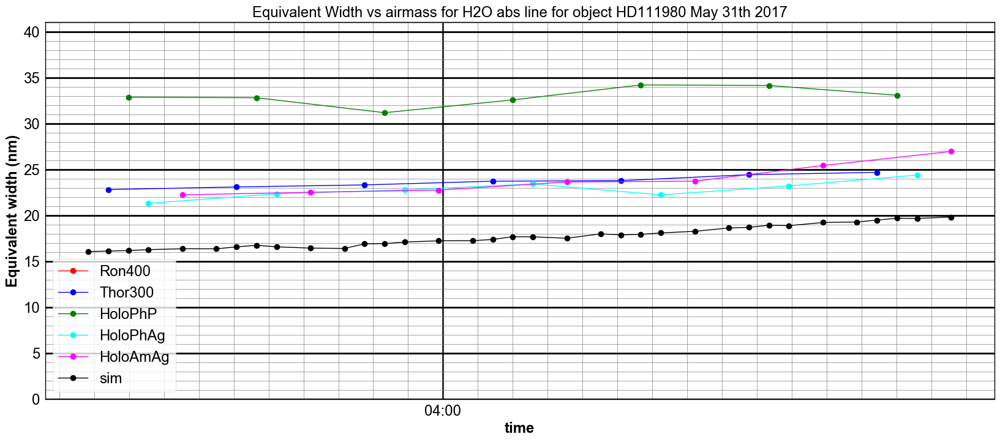

In [201]:
PlotEquivalentWidthVsTime(All_eqw_H2O_Data,All_eqw_H2O_Sim,am,all_dt,'H2O abs line','eqwvstime_H20.pdf')

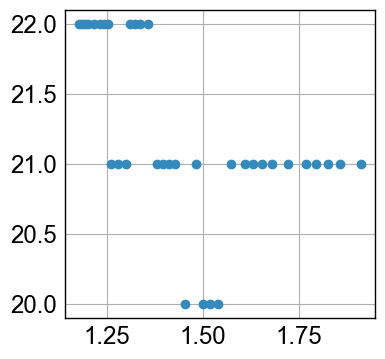

In [202]:
plt.plot(am,all_hum,'o')

In [203]:
X=All_eqw_H2O_Sim/All_eqw_O2_Sim

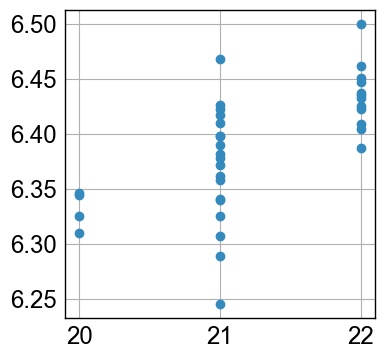

In [204]:
plt.plot(all_hum,X,'o')

In [205]:
print Thor300_index
print Ron400_index
print HoloPhP_index
print HoloPhAg_index
print HoloAmAg_index

[ 1  6 11 16 21 26 31]
[ 0  5 10 15 20 25 30]
[ 2  7 12 17 22 27 32]
[ 3  8 13 18 23 28 33]
[ 4  9 14 19 24 29 34]


In [206]:
X_Thor=All_eqw_H2O_Sim[Thor300_index]/All_eqw_O2_Sim[Thor300_index]
Y_Thor=All_eqw_H2O_Data[Thor300_index]/All_eqw_O2_Data[Thor300_index]

In [207]:
X_HoloPhP=All_eqw_H2O_Sim[HoloPhP_index]/All_eqw_O2_Sim[HoloPhP_index]
Y_HoloPhP=All_eqw_H2O_Data[HoloPhP_index]/All_eqw_O2_Data[HoloPhP_index]

In [208]:
X_HoloPhAg=All_eqw_H2O_Sim[HoloPhAg_index]/All_eqw_O2_Sim[HoloPhAg_index]
Y_HoloPhAg=All_eqw_H2O_Data[HoloPhAg_index]/All_eqw_O2_Data[HoloPhAg_index]

In [209]:
X_HoloAmAg=All_eqw_H2O_Sim[HoloAmAg_index]/All_eqw_O2_Sim[HoloAmAg_index]
Y_HoloAmAg=All_eqw_H2O_Data[HoloAmAg_index]/All_eqw_O2_Data[HoloAmAg_index]

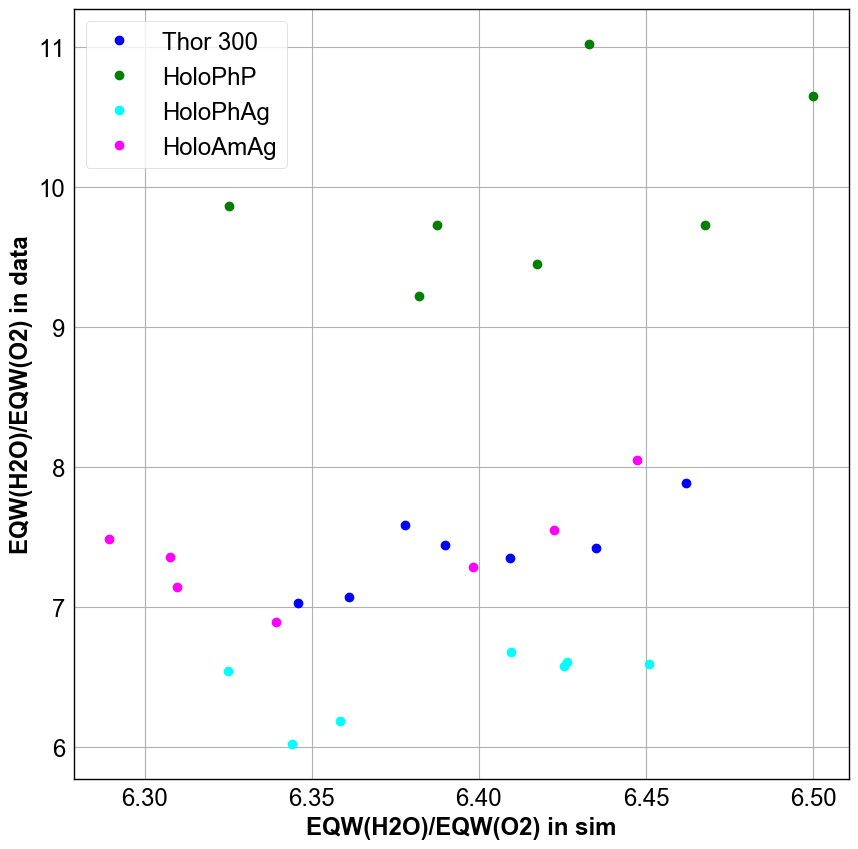

In [210]:
plt.figure(figsize=(10,10))
plt.plot(X_Thor,Y_Thor,'bo',label='Thor 300')
plt.plot(X_HoloPhP,Y_HoloPhP,'go',label='HoloPhP')
plt.plot(X_HoloPhAg,Y_HoloPhAg,'o',color="cyan",label='HoloPhAg')
plt.plot(X_HoloAmAg,Y_HoloAmAg,'o',color="magenta",label='HoloAmAg')
plt.xlabel('EQW(H2O)/EQW(O2) in sim')
plt.ylabel('EQW(H2O)/EQW(O2) in data')
plt.legend()

## Save pandas file

In [211]:
df=pd.DataFrame()

In [212]:
df["airmass"]=all_airmass
df["time"]=all_dates
df["disperser"]=all_filt
df["humidity"]=all_hum
df["EQW_O2_DATA"]= All_eqw_O2_Data
df["EQW_H2O_DATA"]= All_eqw_H2O_Data
df["EQW_O2_SIM"]= All_eqw_O2_Sim
df["EQW_H2O_SIM"]= All_eqw_H2O_Sim

In [213]:
df

,airmass,time,disperser,humidity,EQW_O2_DATA,EQW_H2O_DATA,EQW_O2_SIM,EQW_H2O_SIM
0,1.178,2017-06-01T03:09:08.102,Ron400,22.0,2.667785,-4.572598,2.498867,16.085339
1,1.185,2017-06-01T03:12:00.598,Thor300,22.0,3.075730,22.827724,2.506535,16.130068
2,1.194,2017-06-01T03:14:53.106,HoloPhP,22.0,2.984225,32.883114,2.516339,16.187380
3,1.202,2017-06-01T03:17:45.602,HoloPhAg,22.0,3.234940,21.326792,2.524822,16.287476
4,1.217,2017-06-01T03:22:38.101,HoloAmAg,22.0,2.764833,22.253191,2.540948,16.382453
5,1.232,2017-06-01T03:27:30.598,Ron400,22.0,2.589443,-2.810337,2.557292,16.377048
6,1.242,2017-06-01T03:30:23.095,Thor300,22.0,2.930782,23.111870,2.567287,16.589618
7,1.252,2017-06-01T03:33:15.601,HoloPhP,22.0,3.082819,32.825405,2.577391,16.753306
8,1.262,2017-06-01T03:36:08.102,HoloPhAg,21.0,3.349072,22.366257,2.588668,16.592052
9,1.280,2017-06-01T03:41:00.600,HoloAmAg,21.0,3.061836,22.536613,2.608222,16.451725


In [214]:
fulloutput=os.path.join(outputdir,output_file)

In [215]:
fulloutput

'./spectrum_eqwana/AnaEqWdtFromSpectra_HD111980_May_31th.csv'

In [216]:
df.to_csv(fulloutput)